## TEXT CLASSIFER FOR NEWS CATEGORY DATASET

# Table of Contents

## 1) Importing the basic libraries and loading the given dataset

## 2) Data Cleaning

## 3) Data Preprocessing

## 4) Splitting our dataset for training and testing

## 5) Text Classification using TF-IDF Monogram vectorizer
###   a) Multinomial Naive Bayes
###   b) Logistic Regression
###   c) LinearSVC

## 6) Text Classification using TF-IDF Bi-gram vectorizer
###   a) Multinomial Naive Bayes
###   b) Logistic Regression
###   c) LinearSVC

## 7) Text Classification using Count Uni and Bi-gram vectorizer
###   a) Multinomial Naive Bayes
###   b) Logistic Regression
###   c) LinearSVC

## 8) Text Classification using Hashing vectorizer
###   a) Multinomial Naive Bayes
###   b) Logistic Regression
###   c) LinearSVC

## 9) Comparing the accuracies by ML Models
###   a) Comparision of accuracies for various vectorizations using the MultinomialNB model
###   b) Comparision of accuracies for various vectorizations using the Logistic Regression model
###   c) Comparision of accuracies for various vectorizations using the LinearSVC model

## 10) Testing the Top models using sklearn Pipeline

## 1) Importing the basic libraries and loading the given Dataset.

In [13]:
#importing the basic required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [252]:
# importing warning to remove warning from the file.

import warnings
warnings.filterwarnings('ignore')

In [14]:
#importing the dataset
# Using pandas to import and read the excel file and convert it into an DataFrame.

df = pd.read_excel('Headlines.xlsx')

In [15]:
#obtaining the head of the dataset to check the features and labels

df.head()

,Unnamed: 0,category,headline,authors,link,short_description,date
0,0,CRIME,There Were 2 Mass Shootings In Texas Last Week...,Melissa Jeltsen,https://www.huffingtonpost.com/entry/texas-ama...,She left her husband. He killed their children...,2018-05-26
1,1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Andy McDonald,https://www.huffingtonpost.com/entry/will-smit...,Of course it has a song.,2018-05-26
2,2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,Ron Dicker,https://www.huffingtonpost.com/entry/hugh-gran...,The actor and his longtime girlfriend Anna Ebe...,2018-05-26
3,3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,Ron Dicker,https://www.huffingtonpost.com/entry/jim-carre...,The actor gives Dems an ass-kicking for not fi...,2018-05-26
4,4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,Ron Dicker,https://www.huffingtonpost.com/entry/julianna-...,"The ""Dietland"" actress said using the bags is ...",2018-05-26


From visual inspection of the dataset we can verify that few of the columns are of no use to the classification of the news categories.
These categories are: Unnamed: 0, Authors, link, Date. [These make no impact on predicting the class]

# 2) Data Cleaning.

In [16]:
#Dropping the columns that are not required in the dataset.

df = df.drop(columns=['Unnamed: 0','authors', 'link', 'date'])

In [17]:
#checking the datset after removing the columns
df.head()

,category,headline,short_description
0,CRIME,There Were 2 Mass Shootings In Texas Last Week...,She left her husband. He killed their children...
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Of course it has a song.
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,The actor and his longtime girlfriend Anna Ebe...
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,The actor gives Dems an ass-kicking for not fi...
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,"The ""Dietland"" actress said using the bags is ..."


In [18]:
#getting description of the dataset
df.describe()

,category,headline,short_description
count,200853,200847,181121
unique,41,199343,178332
top,POLITICS,Sunday Roundup,Welcome to the HuffPost Rise Morning Newsbrief...
freq,32739,90,192


In [19]:
#getting info of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200853 entries, 0 to 200852
Data columns (total 3 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   category           200853 non-null  object
 1   headline           200847 non-null  object
 2   short_description  181121 non-null  object
dtypes: object(3)
memory usage: 4.6+ MB


In [20]:
df['category'].describe

<bound method NDFrame.describe of 0                 CRIME
1         ENTERTAINMENT
2         ENTERTAINMENT
3         ENTERTAINMENT
4         ENTERTAINMENT
              ...      
200848             TECH
200849           SPORTS
200850           SPORTS
200851           SPORTS
200852           SPORTS
Name: category, Length: 200853, dtype: object>

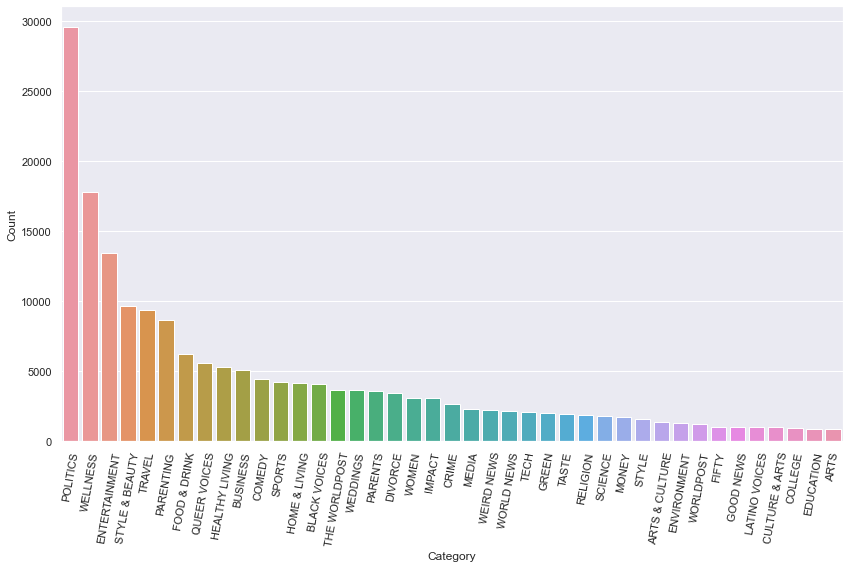

In [208]:
plt.figure(figsize=(14,8))
count = df.category.value_counts()
sns.barplot(x=count.index, y=count)
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=80);

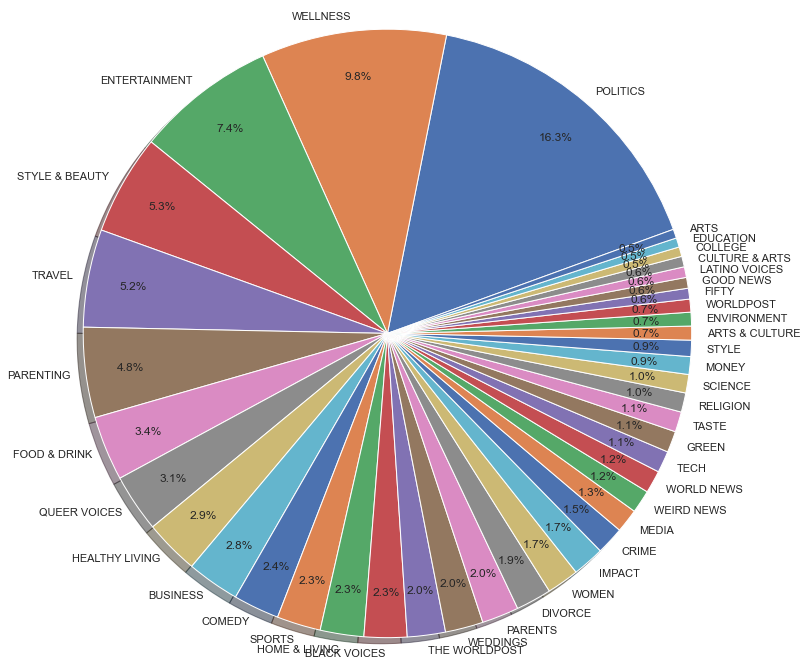

In [696]:
#Comparing the percentage of our categories.
plt.figure(figsize=(12,12))
sizes = df.category.value_counts().values
labels = df.category.value_counts().index
plt.pie(sizes, labels=labels, autopct='%.1f%%',
        shadow=True, pctdistance=0.85, labeldistance=1.05, startangle=20)
plt.axis('equal')
plt.show()


In [22]:
#checking the number of null values
df.isnull().sum()

category                 0
headline                 6
short_description    19732
dtype: int64

As we can see that the short_description has so many null values, we can drop them to increase the accuracy of the model.

In [23]:
#dropping the null values, this can be done using the dropna() function that drops the rows with null values from the dataset.
df.dropna(inplace= True)

In [24]:
#now checkin the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 181120 entries, 0 to 200852
Data columns (total 3 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   category           181120 non-null  object
 1   headline           181120 non-null  object
 2   short_description  181120 non-null  object
dtypes: object(3)
memory usage: 5.5+ MB


Now we can see that we have all columns with equal number of rows which are all non-null.

As we can see that the data type of the headline and short_description is object, we need to convert it into string for further vectorisation.

In [541]:
#converting the headline and short_description to string

headline_column = df['headline'].astype(str)

short_description_column = df['short_description'].astype(str)

In [542]:
df['All_text'] = headline_column + ' ' + short_description_column

In [543]:
#This is how the concatanated set looks like.
df['All_text'].head()

0    There Were 2 Mass Shootings In Texas Last Week...
1    Will Smith Joins Diplo And Nicky Jam For The 2...
2    Hugh Grant Marries For The First Time At Age 5...
3    Jim Carrey Blasts 'Castrato' Adam Schiff And D...
4    Julianna Margulies Uses Donald Trump Poop Bags...
Name: All_text, dtype: object

# 3) Data Preprocessing.

In [259]:
#importing necessary libraries for the data preprocessing.

# re - Regular Expression Operations; it is sequence of characters that forms a search pattern.
import re

# nltk - natural language toolkit; suite of libraries for statistical natural language processing for English 
import nltk

#string - The string module contains a number of functions to process standard Python strings
import string

#stopwords - A stop word is a commonly used word (such as “the”, “a”, “an”, “in”) that are meant to ignore while preprocessing.
from nltk.corpus import stopwords

# Word_ tokenize - divides a string into a bunch of tokens.
from nltk.tokenize import word_tokenize

#WordNetLemaatizer - used to process the grouping of different inflected forms of a word so they can be analyzed as a single item
from nltk.stem import WordNetLemmatizer

#Porter Stemmer - Used for stemming, the process of changing a word into its root form.
from nltk.stem import PorterStemmer

#punctuation - string.punctuation gives all set of punctuations.
from string import punctuation

# punkt - divides a text into a list of sentences to build a model for abbreviation words, collocations, and words that start sentences.
nltk.download('punkt')

# Downloading the stopwords described above.
nltk.download('stopwords')

# Wordnet - a database of English Language used for various programming languages.
nltk.download('wordnet')


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/rajsekhar./nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/rajsekhar./nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/rajsekhar./nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [117]:
#Preprocessing converts all the text into lower cases, escapes punctuation and also joins all the text.
def preprocess_text(text):
    text = text.lower()
    text = re.sub(f"[{re.escape(punctuation)}]","", text)
    text = " ".join(text.split())
    return text


#Stemming usually refers to a crude heuristic process that chops off the ends of words in the hope of achieving this goal correctly most of the time, and often includes the removal of derivational affixes.
def stemming(text):
    tokens = word_tokenize(text)
    ps = PorterStemmer()
    required_words = [ps.stem(x) for x in tokens ]
    sent_with_stemmed_words = ' '.join(required_words)
    return sent_with_stemmed_words


#Lemmatization usually refers to doing things properly with the use of a vocabulary and morphological analysis of words, normally aiming to remove inflectional endings only and to return the base or dictionary form of a word, which is known as the lemma 
def lemmatization(text):
    wordnet_lemmatizer = WordNetLemmatizer()
    sent_with_lemmatized_word = ''.join([wordnet_lemmatizer.lemmatize(x) for x in text ])
    return sent_with_lemmatized_word



#The remove punctuation function removes the punctuation in the lemmatized text.
def remove_punctuation(sentence):
    sent_with_no_punctuation = ''.join([x for x in sentence if x not in string.punctuation])
    return sent_with_no_punctuation



#Remove stop words function removes the common words such as 'a', 'an', 'the' etc,.
def remove_stopwords(text):
    tokens = word_tokenize(text)
    required_words = [x for x in tokens if x not in stopwords.words('english')]
    sent_with_no_stopwords = ' '.join(required_words)
    return sent_with_no_stopwords

In [251]:
#Applying the data preprocessing to just the short_description column.

short_description_column = short_description_column.apply(lambda x: preprocess_text(x))
short_description_column = short_description_column.apply(lambda x: stemming(x))
short_description_column = short_description_column.apply(lambda x: lemmatization(x))
short_description_column = short_description_column.apply(lambda x: remove_punctuation(x))
short_description_column = short_description_column.apply(lambda x: remove_stopwords(x))

In [249]:
#Applying the data preprocessing to just the headlines column.

headline_column = headline_column.apply(lambda x: preprocess_text(x))
headline_column = headline_column.apply(lambda x: stemming(x))
headline_column = headline_column.apply(lambda x: lemmatization(x))
headline_column = headline_column.apply(lambda x: remove_punctuation(x))
headline_column = headline_column.apply(lambda x: remove_stopwords(x))

In [550]:
#Now we can apply the data cleaning process to the concatanated column.

df['All_text'] = df['All_text'].apply(lambda x: preprocess_text(x))
df['All_text'] = df['All_text'].apply(lambda x: stemming(x))
df['All_text'] = df['All_text'].apply(lambda x: lemmatization(x))
df['All_text'] = df['All_text'].apply(lambda x: remove_punctuation(x))
df['All_text'] = df['All_text'].apply(lambda x: remove_stopwords(x))

<BarContainer object of 100 artists>

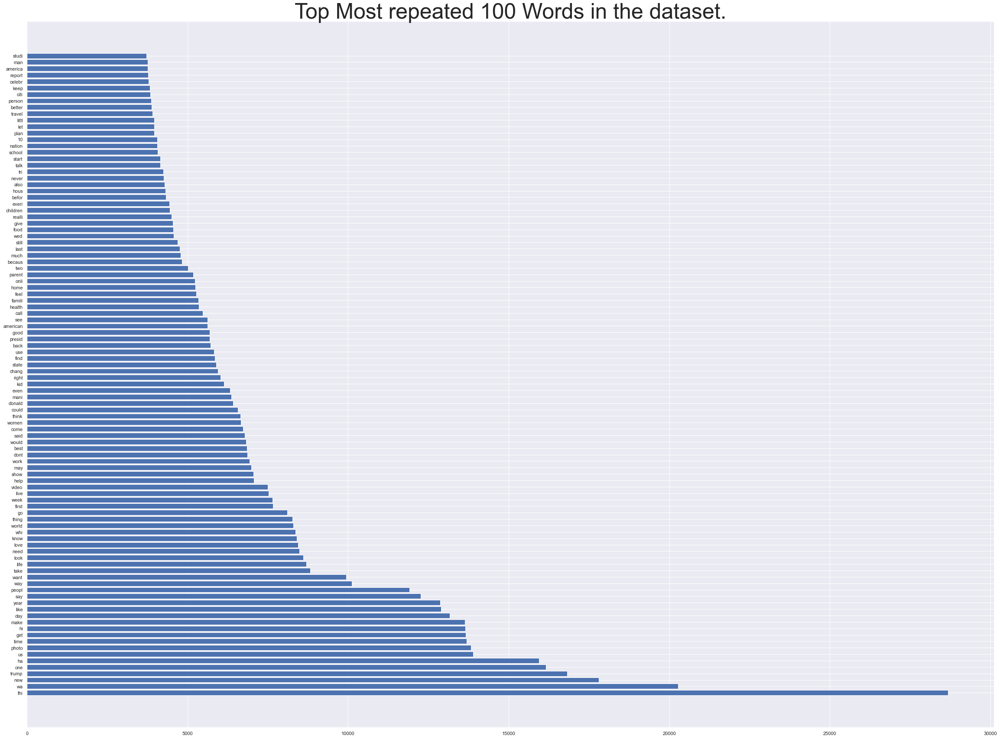

In [551]:
#Analysis of the most repeated words in the df['All_text'].
# This is a frequency distribuition plot, shows how many times the words have been repeated.

from nltk.probability import FreqDist
all_words = [a for row in df['All_text'] for a in row.split()]

all_words_freq = pd.DataFrame(FreqDist(all_words).items(), columns=['key', 'value']).sort_values('value', ascending=False)[:100]
plt.figure(figsize=(40, 30))
plt.title('Top Most repeated 100 Words in the dataset.', fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.barh(all_words_freq['key'], all_words_freq['value'])

# 4) Splitting our dataset for training and testing.

In [263]:
#now we can split our df['All_Text'] into training and testing using the train_test_split from sklearn.

# All_text means the combined set of  processed headlines and the  processed short_description columns.

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(df['All_text'], df['category'], train_size= 0.67, random_state=42)

In [264]:
#Splitting our headline column using the train test split.

# headline means just the processed headline column. 

x_train_headline, x_test_headline, y_train_headline, y_test_headline = train_test_split(headline_column, df['category'], train_size=0.67, random_state=42)

In [265]:
#Splitting ou short_description column using the train test split.

# short_description means just the processed short_description column.

x_train_short, x_test_short, y_train_short, y_test_short = train_test_split(short_description_column, df['category'], train_size=0.67, random_state=42)

In [270]:
#printing the shapes of our All_Text data BEFORE the vectorization process.

print('shape of x_train is: ', x_train.shape)
print('shape of x_test is : ', x_test.shape)
print('shape of y_train is: ', y_train.shape)
print('shape of y_test is: ', y_test.shape)

shape of x_train is:  (121350,)
shape of x_test is :  (59770,)
shape of y_train is:  (121350,)
shape of y_test is:  (59770,)


In [269]:
#printing the shpaes of headline column BEFORE the vectorization process.

print('shape of x_train_headline is : ', x_train_headline.shape)
print('shape of x_test_headline is : ', x_test_headline.shape)
print('shape of y_train_headline is: ', y_train_headline.shape)
print('shape of y_test_headline is; ', y_test_headline.shape)

shape of x_train_headline is :  (121350,)
shape of x_test_headline is :  (59770,)
shape of y_train_headline is:  (121350,)
shape of y_test_headline is;  (59770,)


In [272]:
#printing the shapes of short_description column BEFORE the vectorization process.

print('shape of x_train_short is : ', x_train_short.shape)
print('shape of x_test_short is : ', x_test_short.shape)
print('shape of y_train_short is :', y_train_short.shape)
print('shape of y_test_short is :', y_test_short.shape)

shape of x_train_short is :  (121350,)
shape of x_test_short is :  (59770,)
shape of y_train_short is : (121350,)
shape of y_test_short is : (59770,)


#  5)TEXT CLASSIFICATION USING TF-IDF MONOGRAM VECTORIZER.

In [274]:
#Now we can vectorise our data, i.e converting text into numbers.
#We can do this using vectorisers from sklearn.feature_extraction.text


from sklearn.feature_extraction.text import TfidfVectorizer
vect = TfidfVectorizer(ngram_range=(1,1),max_df=0.8, min_df=10)


#here we have made the max_df = 0.8 which means to ignore words that repeat more than 80 percent of the time.
#min_df is set to be 10, which means to ignore the words that appeared less than 10 times in the dataset.



x_train_alltext_tfidf = vect.fit_transform(x_train)
x_test_alltext_tfidf = vect.transform(x_test)


In [275]:
#Now we do the same for the headlines column.
#we are using the same vectorizer that we have used for the All_Text column, i.e the tf-idf monogram.


x_train_headline_tfidf = vect.fit_transform(x_train_headline)
x_text_headline_tfidf = vect.transform(x_test_headline)

In [276]:
#Vectorization process for the short_description column.

x_train_short_tfidf = vect.fit_transform(x_train_short)
x_test_short_tfidf = vect.transform(x_test_short)

In [277]:
#printing the shapes of training and testing dataset of All_Text column AFTER the vectorization process.

print('shape of x_train_alltext_tfidf is : ', x_train_alltext_tfidf.shape)
print('shape of x_test_alltext_tfidf is : ', x_test_alltext_tfidf.shape)

shape of x_train_alltext_tfidf is :  (121350, 12728)
shape of x_test_alltext_tfidf is :  (59770, 12728)


In [279]:
#printing the shapes of training and testing dataset of headlines column AFTER the vectorization process.

print('shape of the x_train_headline_tfidf is: ', x_train_headline_tfidf.shape)
print('shape of the x_test_headline_tfidf is : ', x_text_headline_tfidf.shape)


shape of the x_train_headline_tfidf is:  (121350, 7823)
shape of the x_test_headline_tfidf is :  (59770, 7823)


In [280]:
#printing the shapes of training and testing dataset of the short_description column AFTER the vectorization process.

print('shape of the x_train_short_tfidf is: ', x_train_short_tfidf.shape)
print('shape of the x_text_short_tfidf is :', x_test_short_tfidf.shape)

shape of the x_train_short_tfidf is:  (121350, 10074)
shape of the x_text_short_tfidf is : (59770, 10074)


In [79]:
#We have to now convert our labels into numbers by label encoder.

#We can do this by using the LabelEncoder from sklearn.preprocessing.

# This step is only done once and there is no necessity to do it again.

from sklearn.preprocessing import LabelEncoder

lbl = LabelEncoder()
y_train = lbl.fit_transform(y_train)
y_test = lbl.fit_transform(y_test)

Training and predicting using the Machine Learning Algorithms that we have.



First we do this with the All_text column and then following that we do with headlines and short_description.



Once that has been completed, we compare the accuracies and various industry required measurments.

## 5)a) 

In [302]:
#                   Multinomial Naive Bayes Using Tf-Idf (Monogram) Vectorizer.




#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The first model that we are going to use is the Multinomial Naive Bayes Model.
#MultiNomial Naive bayes is specially known to be used for text classification, even more than numerical classification!

# The variables used are as follows : 

       # mb_alltext_tfidf = Multinomial applied for the All_Text Column with tfidf monogram Vectorizer.
       # mb_headline_tfidf = Multinomial applied for the headlines Column with tfidf monogram Vectorizer.
       # mb_short_tfidf = Multinomial applied for the short_description column with tfidf monogram Vectorizer.

from sklearn.naive_bayes import MultinomialNB

mb_alltext_tfidf = MultinomialNB()
mb_alltext_tfidf.fit(x_train_alltext_tfidf, y_train)


mb_headline_tfidf = MultinomialNB()
mb_headline_tfidf.fit(x_train_headline_tfidf, y_train)


mb_short_tfidf = MultinomialNB()
mb_short_tfidf.fit(x_train_short_tfidf, y_train)




MultinomialNB()

In [672]:
#we can now test our model and check the accuracy of the model.



# The prediction variables used are : 
#y_predict_alltext_tfidf_mb = prediction of the All_Text column (tfidf monogram) with multinomial naive bayes.
#y_predict_headline_tfidf_mb = prediction of the headline column (tfidf monogram) with multinomial naive bayes.
#y_predict_short_tfidf_mb = prediction of the short_description column (tfidf monogram) with multinomial naive bayes.


y_predict_alltext_tfidf_mb = mb_alltext_tfidf.predict(x_test_alltext_tfidf)
y_predict_headline_tfidf_mb = mb_headline_tfidf.predict(x_text_headline_tfidf)
y_predict_short_tfidf_mb = mb_short_tfidf.predict(x_test_short_tfidf)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_tfidf_mb = accuracy of the All_Text column (tfidf monogram) with multinomial naive bayes.
# accuracy_headline_tfidf_mb = accuracy of the headline column (tfidf monogram) with multinomial naive bayes.
# accuracy_short_tfidf_mb = accuracy of the short_description column (tfidf monogram) with multinomial naive bayes.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (tfidf monogram) with MultinomialNB is :\n', accuracy_score(y_predict_alltext_tfidf_mb, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_tfidf_mb, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_alltext_tfidf, x_train_alltext_tfidf, y_train)))
score1 = (cross_val_score(mb_alltext_tfidf, x_train_alltext_tfidf, y_train))
print('mean of cross validation scores is ', score1.mean())
print('\n\n')
print('the accuracy of headline column (tfidf monogram) with MultinomialNB is :\n', accuracy_score(y_predict_headline_tfidf_mb, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_tfidf_mb, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_headline_tfidf, x_train_headline_tfidf, y_train)))
score2 = (cross_val_score(mb_headline_tfidf, x_train_headline_tfidf, y_train))
print('mean of cross validation scores is ', score2.mean())
print('\n\n')
print('the accuracy of the short_description column (tfidf monogram) with MultinomialNB is : \n', accuracy_score(y_predict_short_tfidf_mb, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_tfidf_mb, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_short_tfidf, x_train_short_tfidf, y_train)))
score3 = (cross_val_score(mb_short_tfidf, x_train_short_tfidf, y_train))
print('mean of cross validation scores is ', score3.mean())
print('\n\n')



the accuracy of the All_Text column (tfidf monogram) with MultinomialNB is :
 0.5061903965199933
the percentage of accuracy is : 50.61903965199933 %
the cross validation scores are : [0.49316028 0.49184178 0.49035847 0.49027606 0.49287186]
mean of cross validation scores is  0.491701689328389



the accuracy of headline column (tfidf monogram) with MultinomialNB is :
 0.5009703864815125
the percentage of accuracy is : 50.09703864815125 %
the cross validation scores are : [0.48912237 0.48842192 0.48590853 0.48932839 0.48895756]
mean of cross validation scores is  0.4883477544293367



the accuracy of the short_description column (tfidf monogram) with MultinomialNB is : 
 0.40075288606324244
the percentage of accuracy is : 40.07528860632424 %
the cross validation scores are : [0.39015245 0.39089411 0.38739184 0.38978162 0.39155336]
mean of cross validation scores is  0.3899546765554182





In [305]:
#Now we import classification report to get all industry standard metrics.


from sklearn.metrics import classification_report



What do these metrics mean?

precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )


recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)


F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)


Support - Support is the number of actual occurences in the dataset.


macro average - Macro average is the direct average of the values in that column.


weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



In [552]:
#             Printing the classification reports for the MultinomialNB Model.

print('\n')

# Classification report for the All_text column
print('      Classification Report for All_Text (tfidf monogram) using MultinomialNB     \n ')
print(classification_report(y_predict_alltext_tfidf_mb, y_test))

print('\n\n\n')

# Classification report for the headlines column
print('      Classification Report for headline (tfidf monogram) using MultinomialNB     \n  ')
print(classification_report(y_predict_headline_tfidf_mb, y_test))
print('\n\n\n')

# Classification report for the short_description column.
print('      Classification Report for short_description (tfidf monogram) using MultinomialNB     \n ')
print(classification_report(y_predict_short_tfidf_mb, y_test))



      Classification Report for All_Text (tfidf monogram) using MultinomialNB     
 
                precision    recall  f1-score   support

          ARTS       0.00      1.00      0.01         1
ARTS & CULTURE       0.00      1.00      0.00         1
  BLACK VOICES       0.05      0.76      0.10        98
      BUSINESS       0.19      0.56      0.29       566
       COLLEGE       0.00      0.00      0.00         0
        COMEDY       0.14      0.74      0.23       266
         CRIME       0.23      0.67      0.35       299
CULTURE & ARTS       0.03      1.00      0.05         9
       DIVORCE       0.34      0.92      0.49       408
     EDUCATION       0.00      0.00      0.00         0
 ENTERTAINMENT       0.79      0.49      0.61      7283
   ENVIRONMENT       0.02      1.00      0.03         8
         FIFTY       0.00      0.00      0.00         0
  FOOD & DRINK       0.70      0.62      0.66      2261
     GOOD NEWS       0.00      0.00      0.00         0
         GREEN  

In [309]:
#importing confusion matrix from sklearn.
#A confusion matrix is a summary of prediction results on a classification problem


from sklearn.metrics import confusion_matrix

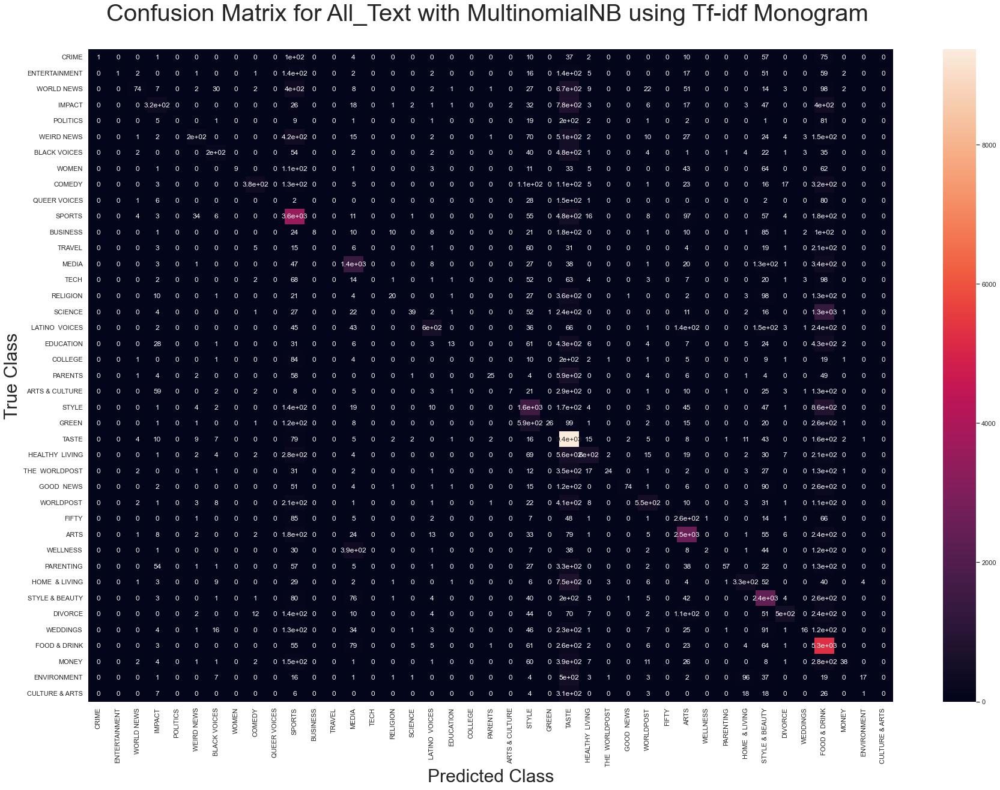

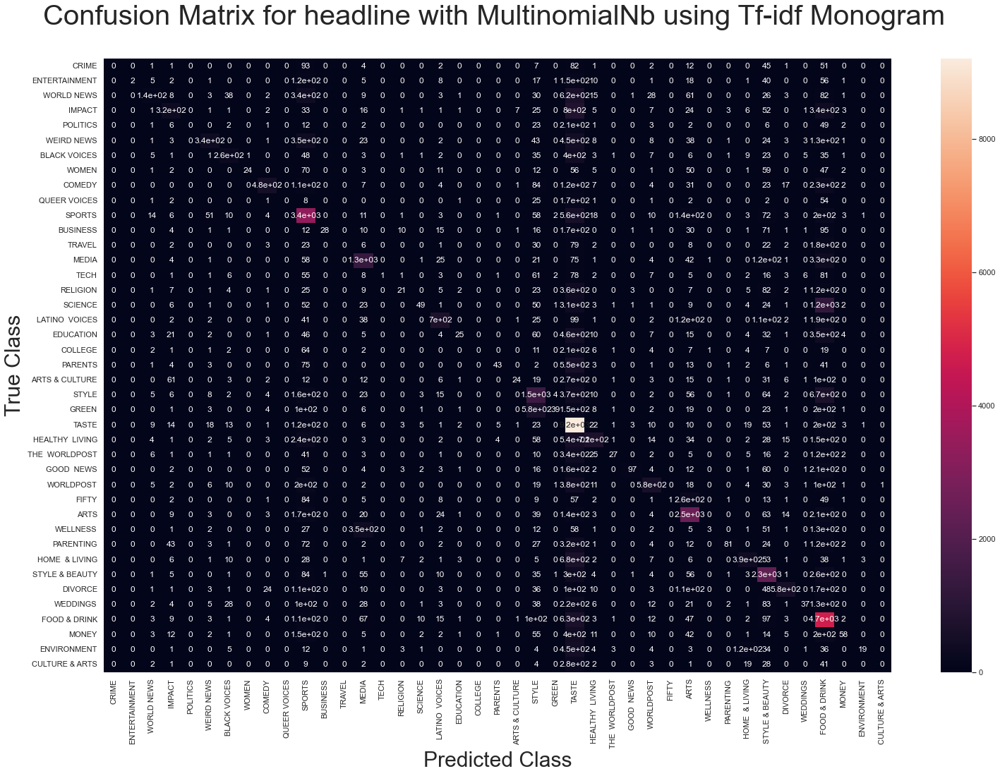

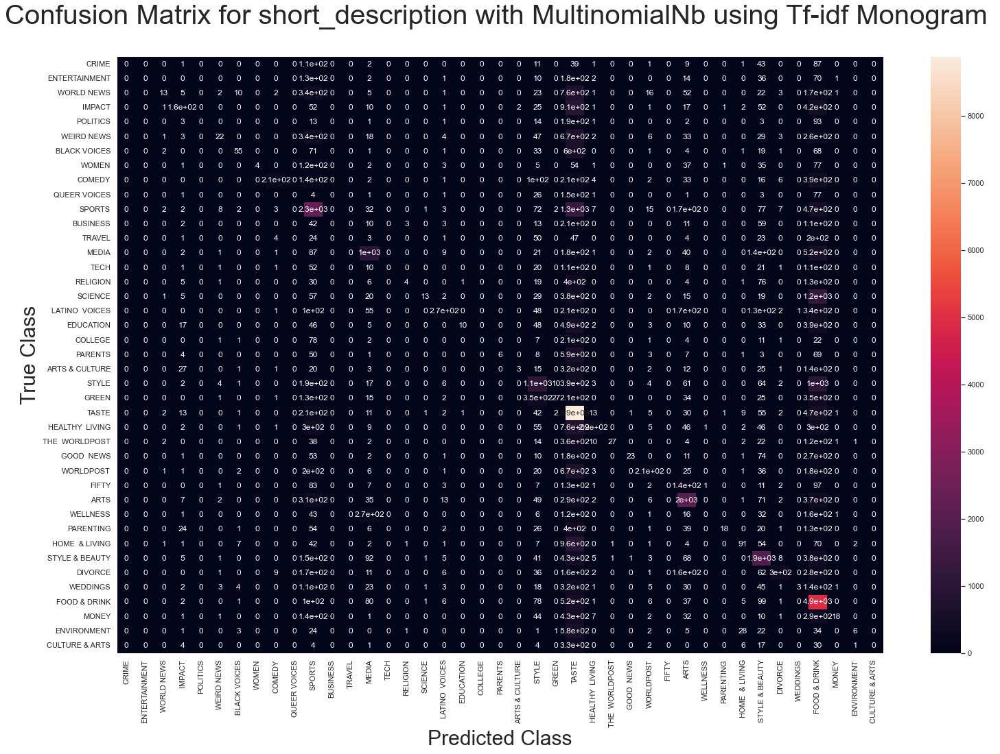

In [555]:
#                        Plotting the confusion matrix for the models.

# All_Text column

cf_matrix_alltext_tfidf_mb = confusion_matrix(y_test, y_predict_alltext_tfidf_mb)
plt.figure(figsize=(30,20))
heatmap1 = sns.heatmap(cf_matrix_alltext_tfidf_mb, xticklabels=Labels, yticklabels=Labels, annot=True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_Text with MultinomialNB using Tf-idf Monogram \n', fontdict={'fontsize': 40, 'fontweight': 'medium'})
plt.show()


# Headlines Column

cf_matrix_headline_tfidf_mb = confusion_matrix(y_test, y_predict_headline_tfidf_mb)
heatmap2 = sns.heatmap(cf_matrix_headline_tfidf_mb, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headline with MultinomialNb using Tf-idf Monogram \n',fontdict={'fontsize': 40, 'fontweight': 'medium'})
plt.show()


# Short_description column

cf_matrix_short_tfidf_mb = confusion_matrix(y_test, y_predict_short_tfidf_mb)
heatmap3 = sns.heatmap(cf_matrix_short_tfidf_mb, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description with MultinomialNb using Tf-idf Monogram \n', fontdict={'fontsize': 40, 'fontweight': 'medium'})
plt.show()


## 5)b)

In [315]:
#                   Logistic Regression using Tf-idf monogram Vectorizer.




#The second model that we would be using the logistic regression.

# The variables used:

         # lr_alltext_tfidf = Logistic Regression applied for the All_Text Column with tfidf monogram Vectorizer.
         # lr_headline_tfidf = Logistic Regression applied for the headlines Column with tfidf monogram Vectorizer.
         # lr_short_tfidf = Logistic Regression applied for the short_description column with tfidf monogram Vectorizer.


# importing Logistic Regression from sklearn.linear_model.
            
from sklearn.linear_model import LogisticRegression 


lr_alltext_tfidf = LogisticRegression()
lr_alltext_tfidf.fit(x_train_alltext_tfidf, y_train)



lr_headline_tfidf = LogisticRegression()
lr_headline_tfidf.fit(x_train_headline_tfidf, y_train)



lr_short_tfidf = LogisticRegression()
lr_short_tfidf.fit(x_train_short_tfidf, y_train)




LogisticRegression()

In [678]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_tfidf_lr = prediction of the All_Text column (tfidf monogram) with Logistic Regression.
#y_predict_headline_tfidf_lr = prediction of the headline column (tfidf monogram) with Logistic Regression.
#y_predict_short_tfidf_lr = prediction of the short_description column (tfidf monogram) with mLogistic Regression.


y_predict_alltext_tfidf_lr = lr_alltext_tfidf.predict(x_test_alltext_tfidf)
y_predict_headline_tfidf_lr = lr_headline_tfidf.predict(x_text_headline_tfidf)
y_predict_short_tfidf_lr = lr_short_tfidf.predict(x_test_short_tfidf)


# And then we print the accuracies of all the models.


# accuracy_alltext_tfidf_lr = accuracy of the All_Text column (tfidf monogram) with Logistic Regression.
# accuracy_headline_tfidf_lr = accuracy of the headline column (tfidf monogram) with Logistic Regression.
# accuracy_short_tfidf_lr = accuracy of the short_description column (tfidf monogram) with Logistic Regression.






#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (tfidf monogram) with Logistic Regression is :\n', accuracy_score(y_predict_alltext_tfidf_lr, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_tfidf_lr, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_alltext_tfidf, x_train_alltext_tfidf, y_train)))
score4 = (cross_val_score(lr_alltext_tfidf, x_train_alltext_tfidf, y_train))
print('mean of cross validation scores is ', score4.mean())
print('\n\n')
print('the accuracy of headline column (tfidf monogram) with Logistic Regression is :\n', accuracy_score(y_predict_headline_tfidf_lr, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_tfidf_lr, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_headline_tfidf, x_train_alltext_tfidf, y_train)))
score5 = (cross_val_score(lr_headline_tfidf, x_train_headline_tfidf, y_train))
print('mean of cross validation scores is ', score5.mean())
print('\n\n')
print('the accuracy of the short_description column (tfidf monogram) with Logistic Regression is : \n', accuracy_score(y_predict_short_tfidf_lr, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_tfidf_lr, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_short_tfidf, x_train_alltext_tfidf, y_train)))
score6 = (cross_val_score(lr_short_tfidf, x_train_short_tfidf, y_train))
print('mean of cross validation scores is ', score6.mean())
print('\n\n')



the accuracy of the All_Text column (tfidf monogram) with Logistic Regression is :
 0.6092019407729631
the percentage of accuracy is : 60.92019407729631 %
the cross validation scores are : [0.60210136 0.60098888 0.60309023 0.60271941 0.60461475]
mean of cross validation scores is  0.6027029254223321



the accuracy of headline column (tfidf monogram) with Logistic Regression is :
 0.5721599464614355
the percentage of accuracy is : 57.21599464614356 %
the cross validation scores are : [0.60210136 0.60098888 0.60309023 0.60271941 0.60461475]
mean of cross validation scores is  0.5677379480840544



the accuracy of the short_description column (tfidf monogram) with Logistic Regression is : 
 0.46519993307679436
the percentage of accuracy is : 46.519993307679435 %
the cross validation scores are : [0.60210136 0.60098888 0.60309023 0.60271941 0.60461475]
mean of cross validation scores is  0.4602142562834775





In [556]:
#.            Classification reports for Logistic Regression using Tf-Idf monogram Vectorizer.

print('\n')

# Classification report for the headline column
print('      Classification Report for All_Text (tfidf monogram) using Logistic Regression     \n ')
print(classification_report(y_predict_alltext_tfidf_lr, y_test))

print('\n\n\n')

# Classification report for the headlines column
print('      Classification Report for headline (tfidf monogram) using Logistic Regression    \n  ')
print(classification_report(y_predict_headline_tfidf_lr, y_test))
print('\n\n\n')

# Classification report for the short_description column
print('      Classification Report for short_description (tfidf monogram) using Logistic Regression     \n ')
print(classification_report(y_predict_short_tfidf_lr, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (tfidf monogram) using Logistic Regression     
 
                precision    recall  f1-score   support

          ARTS       0.11      0.52      0.18        62
ARTS & CULTURE       0.18      0.47      0.26       170
  BLACK VOICES       0.35      0.57      0.44       886
      BUSINESS       0.45      0.50      0.48      1509
       COLLEGE       0.24      0.48      0.32       163
        COMEDY       0.41      0.60      0.49       979
         CRIME       0.50      0.54      0.52       781
CULTURE & ARTS       0.26      0.66      0.37       134
       DIVORCE       0.68      0.83      0.75       916
     EDUCATION       0.28      0.44      0.34       170
 ENTERTAINMENT       0.76      0.57      0.65      5979
   ENVIRONMENT       0.18      0.68      0.29       126
         FIFTY       0.12      0.55      0.19        75
  FOOD & DRINK       0.75      0.63      0.69      2427
     GOOD NEWS       0.11      0.49      0.18        75
         G

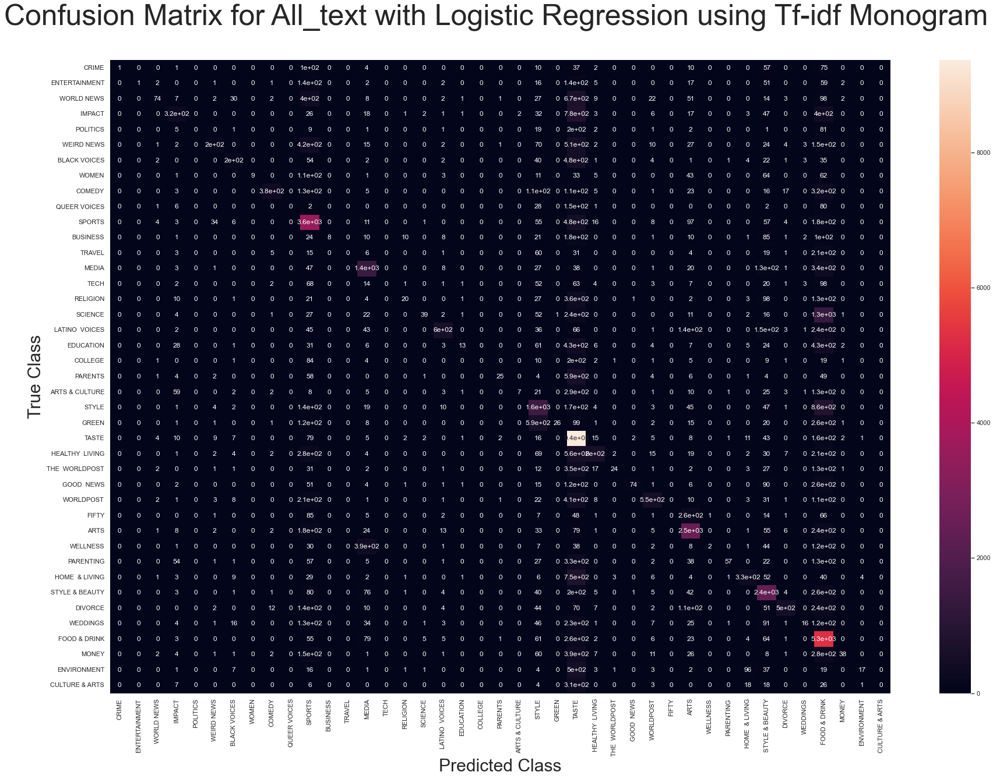

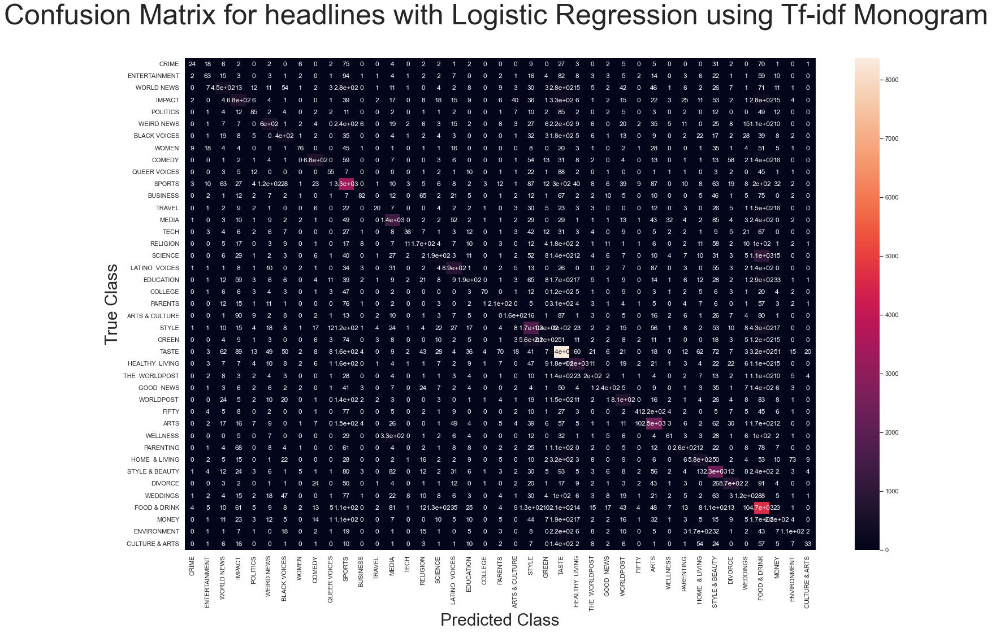

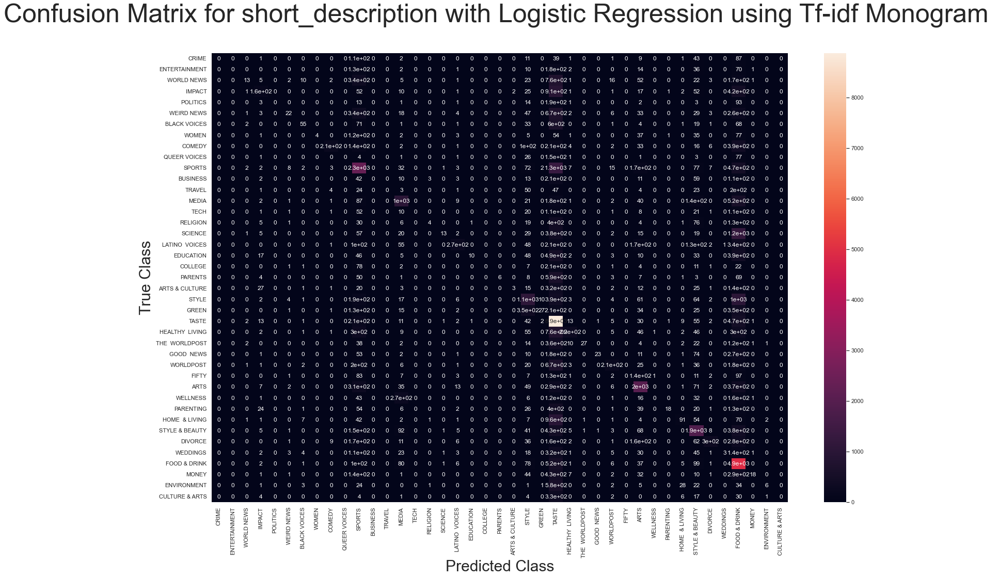

In [559]:
#           Plotting the confusion matrix for the models.


# All_ text Column
cf_matrix_alltext_tfidf_lr = confusion_matrix(y_test, y_predict_alltext_tfidf_lr)
plt.figure(figsize=(30,20))
heatmap5 = sns.heatmap(cf_matrix_alltext_tfidf_mb, xticklabels=Labels, yticklabels=Labels, annot=True)
plt.xlabel('Predicted Class',fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text with Logistic Regression using Tf-idf Monogram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.show()


# Headlines column
cf_matrix_headline_tfidf_lr = confusion_matrix(y_test, y_predict_headline_tfidf_lr)
heatmap6 = sns.heatmap(cf_matrix_headline_tfidf_lr, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headlines with Logistic Regression using Tf-idf Monogram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.show()


# short_description model
cf_matrix_short_tfidf_lr = confusion_matrix(y_test, y_predict_short_tfidf_lr)
heatmap7 = sns.heatmap(cf_matrix_short_tfidf_mb, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description with Logistic Regression using Tf-idf Monogram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.show()


## 5)c)

In [322]:
#                  LinearSVC model for TF_IDF monogram Vectorizer.


#The Last model that we would be using the LinearSVC.
#LinearSVC model uses support vectors.


# The variables used:
     # svc_alltext_tfidf = LinearSVC applied for the All_Text Column with tfidf monogram Vectorizer.
     # svc_headline_tfidf = LinearSVC applied for the headlines Column with tfidf monogram Vectorizer.
     # svc_short_tfidf = LinearSVC applied for the short_description column with tfidf monogram Vectorizer.

    
# Importing LinearSVC from sklearn.svm
from sklearn.svm import LinearSVC



svc_alltext_tfidf = LinearSVC()
svc_alltext_tfidf.fit(x_train_alltext_tfidf, y_train)



svc_headline_tfidf = LinearSVC()
svc_headline_tfidf.fit(x_train_headline_tfidf, y_train)



svc_short_tfidf = LinearSVC()
svc_short_tfidf.fit(x_train_short_tfidf, y_train)





LinearSVC()

In [679]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_tfidf_svc = prediction of the All_Text column (tfidf monogram) with LinearSVC.
#y_predict_headline_tfidf_svc = prediction of the headline column (tfidf monogram) with LinearSVC.
#y_predict_short_tfidf_svc = prediction of the short_description column (tfidf monogram) with LinearSVC.


y_predict_alltext_tfidf_svc = svc_alltext_tfidf.predict(x_test_alltext_tfidf)
y_predict_headline_tfidf_svc = svc_headline_tfidf.predict(x_text_headline_tfidf)
y_predict_short_tfidf_svc = svc_short_tfidf.predict(x_test_short_tfidf)


# And then we print the accuracies of all the models.


# accuracy_alltext_tfidf_svc = accuracy of the All_Text column (tfidf monogram) with LinearSVC.
# accuracy_headline_tfidf_svc = accuracy of the headline column (tfidf monogram) with LinearSVC.
# accuracy_short_tfidf_svc = accuracy of the short_description column (tfidf monogram) with LinearSVC.






#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (tfidf monogram) with LinearSVC is :\n', accuracy_score(y_predict_alltext_tfidf_svc, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_tfidf_svc, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_alltext_tfidf, x_train_alltext_tfidf, y_train)))
score7 = (cross_val_score(svc_alltext_tfidf, x_train_alltext_tfidf, y_train))
print('mean of cross validation scores is ', score7.mean())
print('\n\n')
print('the accuracy of headline column (tfidf monogram) with LinearSVC is :\n', accuracy_score(y_predict_headline_tfidf_svc, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_tfidf_svc, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_headline_tfidf, x_train_headline_tfidf, y_train)))
score8 = (cross_val_score(svc_headline_tfidf, x_train_headline_tfidf, y_train))
print('mean of cross validation scores is ', score8.mean())
print('\n\n')
print('the accuracy of the short_description column (tfidf monogram) with LinearSVC is : \n', accuracy_score(y_predict_short_tfidf_svc, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_tfidf_svc, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_short_tfidf, x_train_short_tfidf, y_train)))
score9 = (cross_val_score(svc_short_tfidf, x_train_short_tfidf, y_train))
print('mean of cross validation scores is ', score9.mean())
print('\n\n')




the accuracy of the All_Text column (tfidf monogram) with LinearSVC is :
 0.6075121298310189
the percentage of accuracy is : 60.75121298310189 %
the cross validation scores are : [0.59967037 0.59752781 0.59785744 0.60317264 0.602637  ]
mean of cross validation scores is  0.6001730531520395



the accuracy of headline column (tfidf monogram) with LinearSVC is :
 0.5812615024259662
the percentage of accuracy is : 58.12615024259662 %
the cross validation scores are : [0.57424804 0.57140503 0.57185826 0.57564895 0.57441286]
mean of cross validation scores is  0.5735146271116605



the accuracy of the short_description column (tfidf monogram) with LinearSVC is : 
 0.46536724109084826
the percentage of accuracy is : 46.53672410908483 %
the cross validation scores are : [0.45290482 0.4512567  0.45055624 0.45583024 0.45574784]
mean of cross validation scores is  0.4532591676967449





In [605]:
#                   Classification reports for TF-IDF monogram using LinearSVC.


print('\n')

# Report for All_Text Column
print('      Classification Report for All_Text (tfidf monogram) using LinearSVC     \n ')
print(classification_report(y_predict_alltext_tfidf_svc, y_test))


print('\n\n\n')


# Report for headlines column
print('      Classification Report for headline (tfidf monogram) using LinearSVC     \n  ')
print(classification_report(y_predict_headline_tfidf_svc, y_test))


print('\n\n\n')


# Report for short_description column
print('      Classification Report for short_description (tfidf monogram) using LinearSVC      \n ')
print(classification_report(y_predict_short_tfidf_svc, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (tfidf monogram) using LinearSVC     
 
                precision    recall  f1-score   support

          ARTS       0.20      0.39      0.26       155
ARTS & CULTURE       0.27      0.39      0.32       311
  BLACK VOICES       0.41      0.52      0.46      1110
      BUSINESS       0.45      0.48      0.46      1552
       COLLEGE       0.36      0.50      0.42       236
        COMEDY       0.45      0.53      0.49      1216
         CRIME       0.54      0.52      0.53       881
CULTURE & ARTS       0.32      0.52      0.40       211
       DIVORCE       0.73      0.78      0.75      1047
     EDUCATION       0.29      0.42      0.34       186
 ENTERTAINMENT       0.71      0.63      0.67      5084
   ENVIRONMENT       0.31      0.54      0.39       272
         FIFTY       0.17      0.40      0.24       154
  FOOD & DRINK       0.71      0.62      0.66      2342
     GOOD NEWS       0.19      0.32      0.24       206
         GREEN      

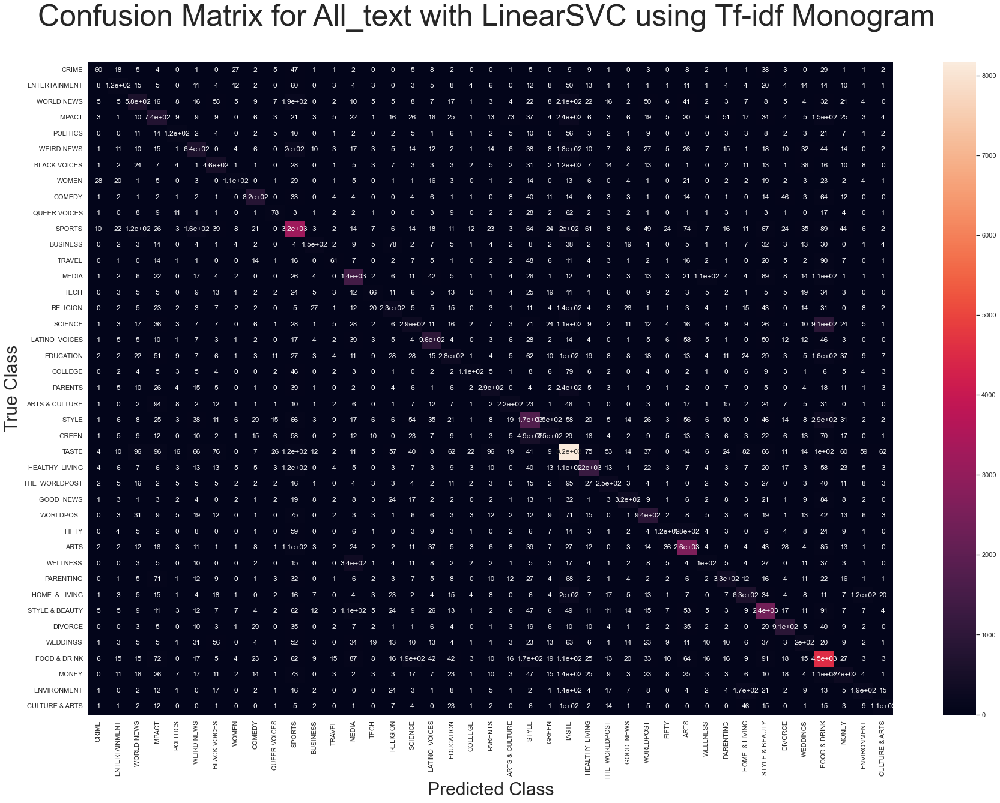

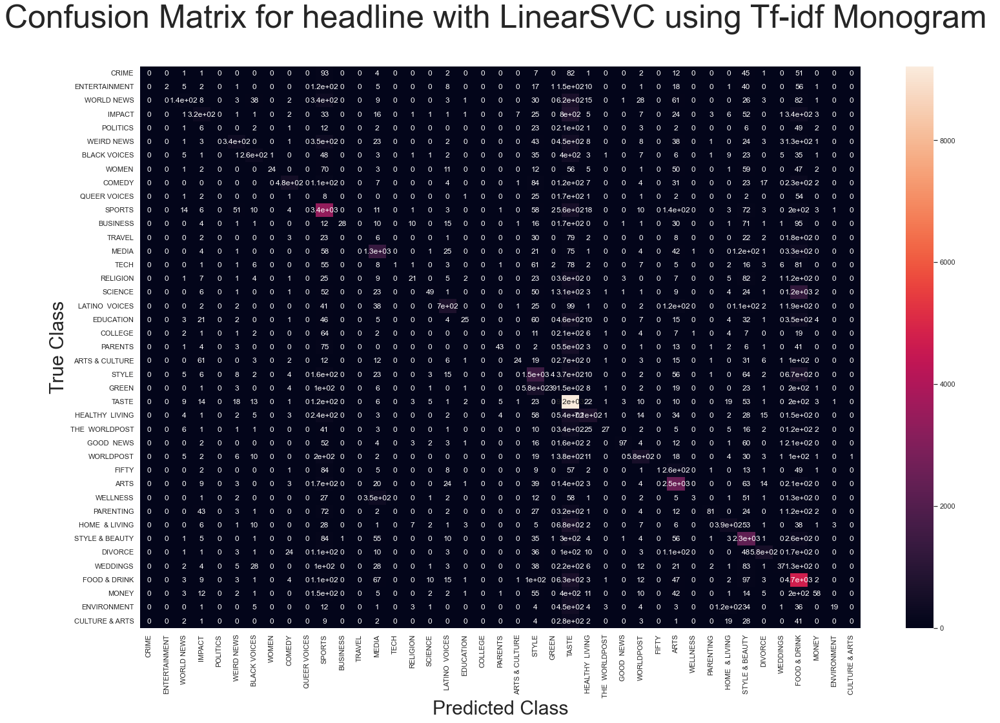

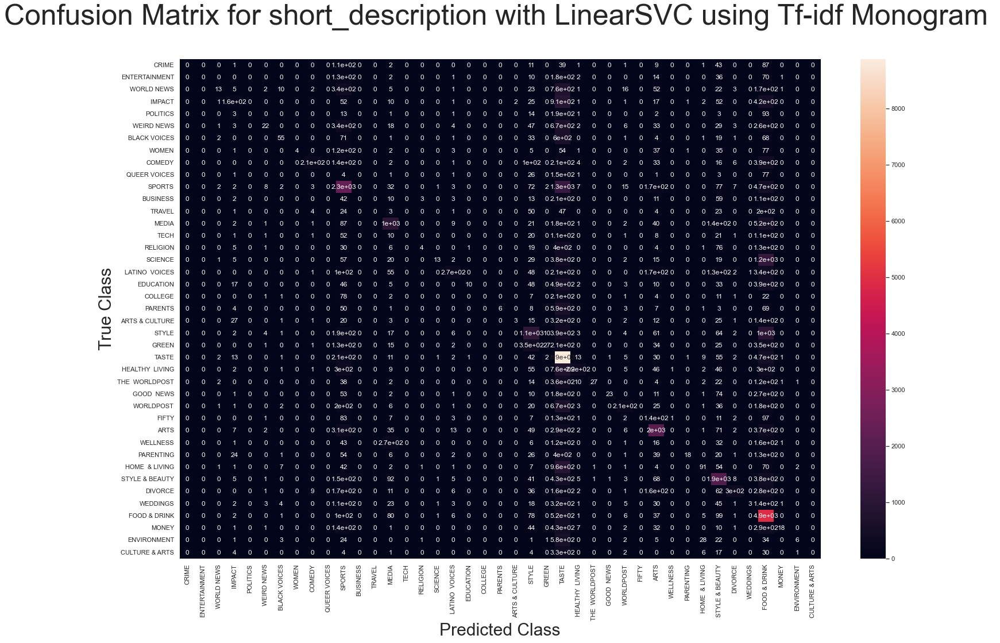

In [561]:
#                        Plotting the confusion Matrix




# All_text column
cf_matrix_alltext_tfidf_svc = confusion_matrix(y_test, y_predict_alltext_tfidf_svc)
plt.figure(figsize=(30,20))
heatmap90 = sns.heatmap(cf_matrix_alltext_tfidf_svc, xticklabels=Labels, yticklabels=Labels, annot=True)
plt.xlabel('Predicted Class',fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text with LinearSVC using Tf-idf Monogram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.show()



# headline column
cf_matrix_headline_tfidf_svc = confusion_matrix(y_test, y_predict_headline_tfidf_svc)
heatmap91 = sns.heatmap(cf_matrix_headline_tfidf_mb, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headline with LinearSVC using Tf-idf Monogram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.show()


# short_description column
cf_matrix_short_tfidf_svc = confusion_matrix(y_test, y_predict_short_tfidf_svc)
heatmap92 = sns.heatmap(cf_matrix_short_tfidf_mb, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description with LinearSVC using Tf-idf Monogram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.show()


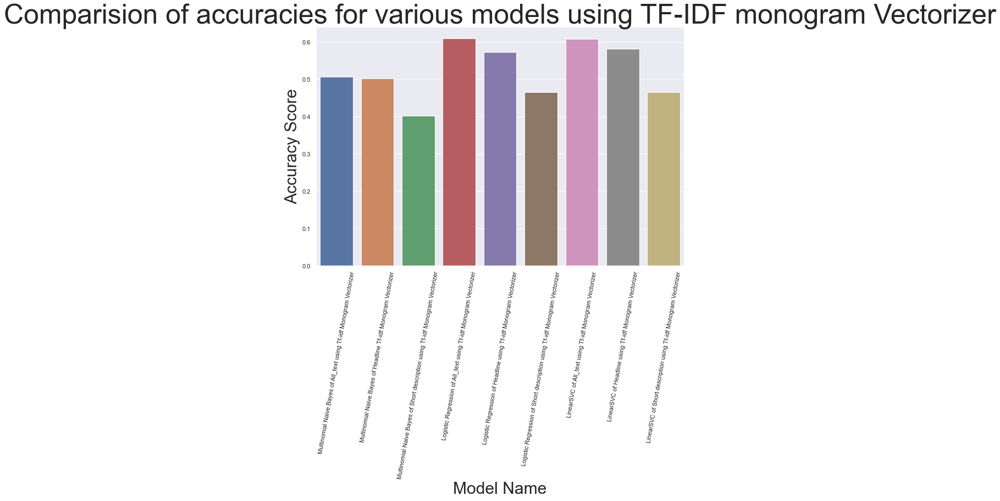

In [599]:
models_tfidf_monogram= ['Multinomial Naive Bayes of All_text using Tf-idf Monogram Vectorizer',
                             'Multinomial Naive Bayes of Headline Tf-idf Monogram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Tf-idf Monogram Vectorizer',
                             'Logistic Regression of All_text using Tf-idf Monogram Vectorizer',
                             'Logistic Regression of Headline using Tf-idf Monogram Vectorizer',
                             'Logistic Regression of Short description using Tf-idf Monogram Vectorizer',
                             'LinearSVC of All_text using Tf-idf Monogram Vectorizer',
                             'LinearSVC of Headline using Tf-idf Monogram Vectorizer',
                             'LinearSVC of Short description using Tf-idf Monogram Vectorizer']


df2 = pd.DataFrame({'model':['Multinomial Naive Bayes of All_text using Tf-idf Monogram Vectorizer',
                             'Multinomial Naive Bayes of Headline Tf-idf Monogram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Tf-idf Monogram Vectorizer',
                             'Logistic Regression of All_text using Tf-idf Monogram Vectorizer',
                             'Logistic Regression of Headline using Tf-idf Monogram Vectorizer',
                             'Logistic Regression of Short description using Tf-idf Monogram Vectorizer',
                             'LinearSVC of All_text using Tf-idf Monogram Vectorizer',
                             'LinearSVC of Headline using Tf-idf Monogram Vectorizer',
                             'LinearSVC of Short description using Tf-idf Monogram Vectorizer'], 
                    'val':  [accuracy_score(y_predict_alltext_tfidf_mb, y_test),
                            accuracy_score(y_predict_headline_tfidf_mb, y_test),
                            accuracy_score(y_predict_short_tfidf_mb, y_test),
                            accuracy_score(y_predict_alltext_tfidf_lr, y_test),
                            accuracy_score(y_predict_headline_tfidf_lr, y_test),
                            accuracy_score(y_predict_short_tfidf_lr, y_test),
                            accuracy_score(y_predict_alltext_tfidf_svc, y_test),
                            accuracy_score(y_predict_headline_tfidf_svc, y_test),
                            accuracy_score(y_predict_short_tfidf_svc, y_test)]} , index= models_tfidf_monogram)


plotdata = df2
plt.figure(figsize=(12, 8))
sns.barplot(df2['model'], df2['val'])
plt.title("Comparision of accuracies for various models using TF-IDF monogram Vectorizer", fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.xlabel("Model Name",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.ylabel("Accuracy Score",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.xticks(rotation = 80)
plt.show()

# 6) Machine Learning Model Using TF-IDF Bigram Vectorizer.

In [595]:
vect2 = TfidfVectorizer(ngram_range=(2,2), max_df=0.8, min_df=10)
#here we have made the max_df = 0.8 which means to ignore words that repeat more than 80 percent of the time.
#min_df is set to be 10, which means to ignore the words that appeared less than 10 times in the dataset.
x_train_alltext_tfidf2 = vect2.fit_transform(x_train)
x_test_alltext_tfidf2 = vect2.transform(x_test)



In [439]:
#Now we do the same for the headlines column.
#we are using the same vectorizer that we have used for the All_Text column.

x_train_headline_tfidf2 = vect2.fit_transform(x_train_headline)
x_test_headline_tfidf2 = vect2.transform(x_test_headline)

In [440]:
#Now we do the same for the short_description column.
#we are using the same vectorizer that we have used for the All_Text column.

x_train_short_tfidf2 = vect2.fit_transform(x_train_headline)
x_test_short_tfidf2 = vect2.transform(x_test_headline)

In [441]:
print(x_train_alltext_tfidf2.shape)
print(x_train_headline_tfidf2.shape)
print(x_train_short_tfidf2.shape)
print(x_test_short_tfidf.shape)
print(y_test.shape)

(121350, 17441)
(121350, 4596)
(121350, 4596)
(59770, 10074)
(59770,)


## 6)a

In [442]:
#                   Multinomial Naive Bayes Using Tf-Idf (Bigram) Vectorizer.




#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The first model that we are going to use is the Multinomial Naive Bayes Model.
#MultiNomial Naive bayes is specially known to be used for text classification, even more than numerical classification!

# The variables used are as follows : 

       # mb_alltext_tfidf2 = Multinomial applied for the All_Text Column with tfidf Bigram Vectorizer.
       # mb_headline_tfidf2 = Multinomial applied for the headlines Column with tfidf Bigram Vectorizer.
       # mb_short_tfidf2 = Multinomial applied for the short_description column with tfidf Bigram Vectorizer.


from sklearn.naive_bayes import MultinomialNB

mb_alltext_tfidf2 = MultinomialNB()
mb_alltext_tfidf2.fit(x_train_alltext_tfidf2, y_train)


mb_headline_tfidf2 = MultinomialNB()
mb_headline_tfidf2.fit(x_train_headline_tfidf2, y_train)


mb_short_tfidf2 = MultinomialNB()
mb_short_tfidf2.fit(x_train_short_tfidf2, y_train)







MultinomialNB()

In [676]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_tfidf_mb2 = prediction of the All_Text column (tfidf bigram) with multinomial naive bayes.
#y_predict_headline_tfidf_mb2 = prediction of the headline column (tfidf bigram) with multinomial naive bayes.
#y_predict_short_tfidf_mb2 = prediction of the short_description column (tfidf bigram) with multinomial naive bayes.


y_predict_alltext_tfidf_mb2 = mb_alltext_tfidf2.predict(x_test_alltext_tfidf2)
y_predict_headline_tfidf_mb2 = mb_headline_tfidf2.predict(x_text_headline_tfidf2)
y_predict_short_tfidf_mb2 = mb_short_tfidf2.predict(x_test_short_tfidf2)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_tfidf_mb2 = accuracy of the All_Text column (tfidf bigram) with multinomial naive bayes.
# accuracy_headline_tfidf_mb2 = accuracy of the headline column (tfidf bigram) with multinomial naive bayes.
# accuracy_short_tfidf_mb2 = accuracy of the short_description column (tfidf bigram) with multinomial naive bayes.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (tfidf bigram) with MultinomialNB is :\n', accuracy_score(y_predict_alltext_tfidf_mb2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_tfidf_mb2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_alltext_tfidf2, x_train_alltext_tfidf2, y_train)))
score10 = (cross_val_score(mb_alltext_tfidf2, x_train_alltext_tfidf2, y_train))
print('mean of cross validation scores is ', score10.mean())
print('\n\n')
print('the accuracy of headline column (tfidf bigram) with MultinomialNB is :\n', accuracy_score(y_predict_headline_tfidf_mb2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_tfidf_mb2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_headline_tfidf2, x_train_headline_tfidf2, y_train)))
score11 = (cross_val_score(mb_headline_tfidf2, x_train_headline_tfidf2, y_train))
print('mean of cross validation scores is ', score11.mean())
print('\n\n')
print('the accuracy of the short_description column (tfidf bigram) with MultinomialNB is : \n', accuracy_score(y_predict_short_tfidf_mb2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_tfidf_mb2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_short_tfidf2, x_train_short_tfidf2, y_train)))
score12 = (cross_val_score(mb_short_tfidf2, x_train_short_tfidf2, y_train))
print('mean of cross validation scores is ', score12.mean())
print('\n\n')



the accuracy of the All_Text column (tfidf bigram) with MultinomialNB is :
 0.4095867492052869
the percentage of accuracy is : 40.95867492052869 %
the cross validation scores are : [0.40881747 0.40222497 0.40160692 0.4066337  0.40321384]
mean of cross validation scores is  0.4044993819530284



the accuracy of headline column (tfidf bigram) with MultinomialNB is :
 0.33123640622385814
the percentage of accuracy is : 33.123640622385814 %
the cross validation scores are : [0.331644   0.33065513 0.32933663 0.33304491 0.33065513]
mean of cross validation scores is  0.33106716110424395



the accuracy of the short_description column (tfidf bigram) with MultinomialNB is : 
 0.33123640622385814
the percentage of accuracy is : 33.123640622385814 %
the cross validation scores are : [0.331644   0.33065513 0.32933663 0.33304491 0.33065513]
mean of cross validation scores is  0.33106716110424395





In [607]:
#                   Classification reports for TF-IDF Bi-gram using Multinomial Naive Bayes.


print('\n')

# Report for All_Text Column
print('      Classification Report for All_Text (tfidf bigram) using MultinomialNB     \n ')
print(classification_report(y_predict_alltext_tfidf_mb2, y_test))


print('\n\n\n')


# Report for headlines column
print('      Classification Report for headline (tfidf bigram) using MultinomialNB     \n  ')
print(classification_report(y_predict_headline_tfidf_mb2, y_test))


print('\n\n\n')


# Report for short_description column
print('      Classification Report for short_description (tfidf bigram) using MultinomialNB      \n ')
print(classification_report(y_predict_short_tfidf_mb2, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (tfidf bigram) using MultinomialNB     
 
                precision    recall  f1-score   support

          ARTS       0.00      0.00      0.00         0
ARTS & CULTURE       0.00      0.00      0.00         0
  BLACK VOICES       0.11      0.64      0.19       245
      BUSINESS       0.11      0.58      0.19       318
       COLLEGE       0.00      0.00      0.00         0
        COMEDY       0.14      0.67      0.23       294
         CRIME       0.14      0.61      0.23       193
CULTURE & ARTS       0.03      1.00      0.06        10
       DIVORCE       0.20      0.86      0.32       258
     EDUCATION       0.00      0.00      0.00         2
 ENTERTAINMENT       0.62      0.45      0.52      6213
   ENVIRONMENT       0.09      0.95      0.16        43
         FIFTY       0.00      0.00      0.00         0
  FOOD & DRINK       0.31      0.58      0.41      1098
     GOOD NEWS       0.00      0.00      0.00         0
         GREEN    

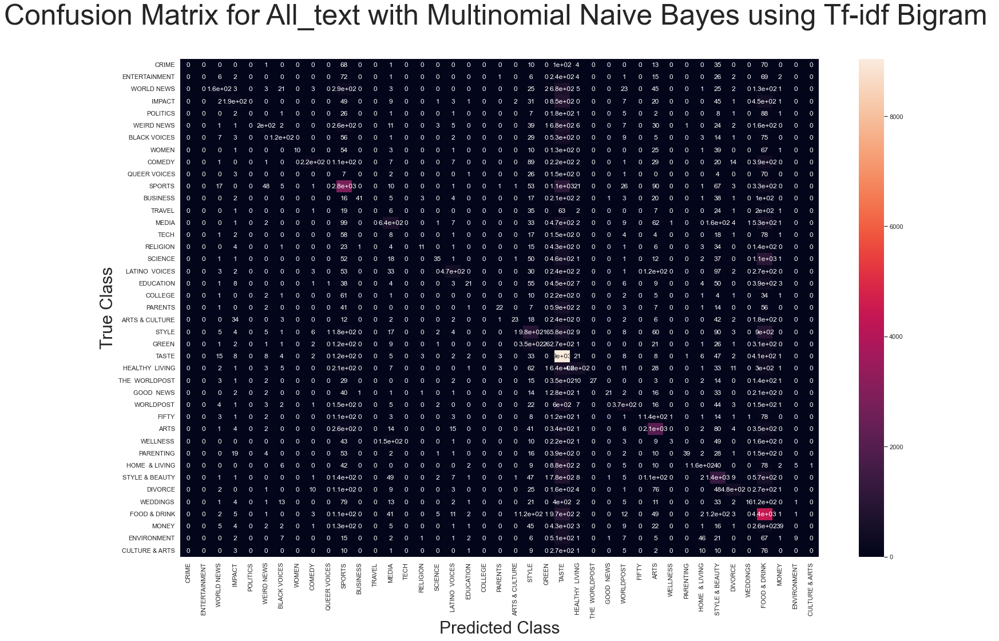

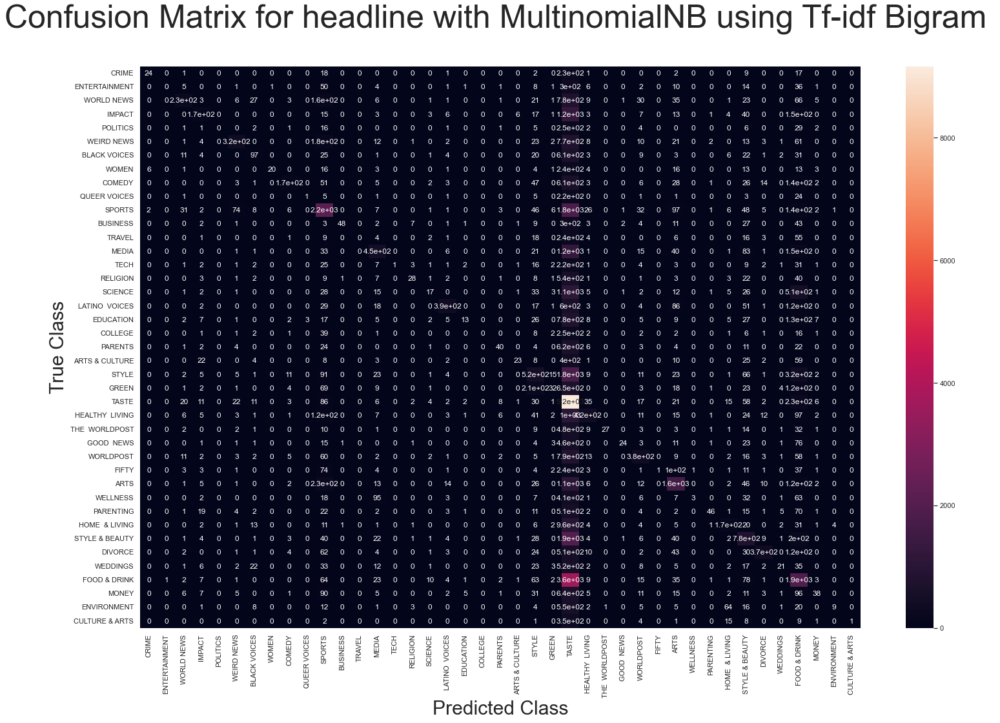

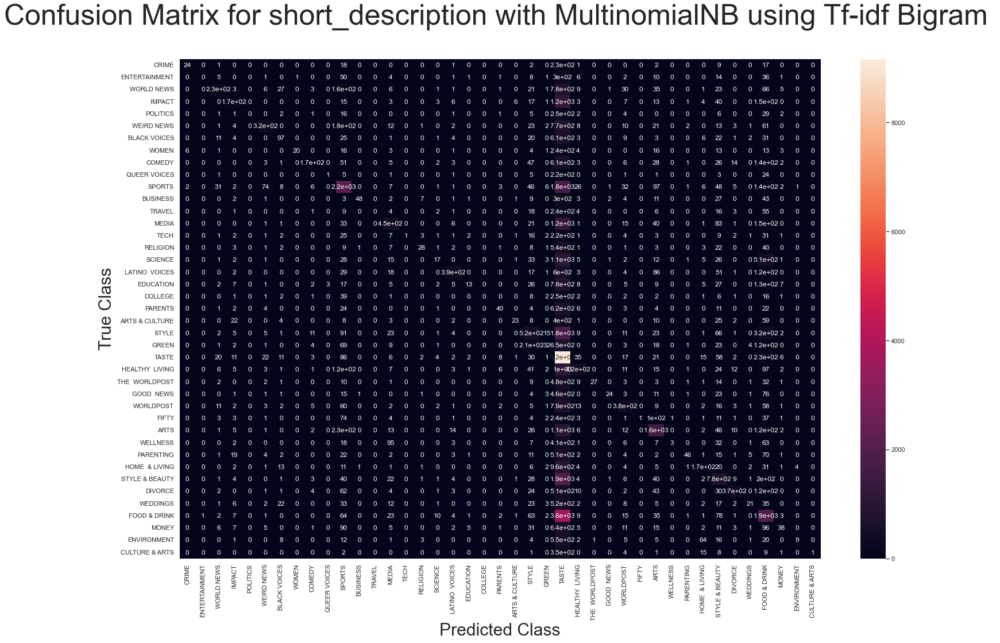

In [608]:
#                                    Plotting the confusion matrix.


# For All_text
cf_matrix_alltext_tfidf_mb2 = confusion_matrix(y_test, y_predict_alltext_tfidf_mb2)
heatmap10 = sns.heatmap(cf_matrix_alltext_tfidf_mb2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text with Multinomial Naive Bayes using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')


# For headline
cf_matrix_headline_tfidf_mb2 = confusion_matrix(y_test, y_predict_headline_tfidf_mb2)
heatmap11 = sns.heatmap(cf_matrix_headline_tfidf_mb2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headline with MultinomialNB using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')


# For short_description
cf_matrix_short_tfidf_mb2 = confusion_matrix(y_test, y_predict_short_tfidf_mb2)
heatmap12 = sns.heatmap(cf_matrix_short_tfidf_mb2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description with MultinomialNB using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())



## 6)b)

In [373]:
#                   Logistic Regression Using Tf-Idf (Bigram) Vectorizer.




#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The second model that we are going to use is the Logistic Regression.

# The variables used are as follows : 

       # lr_alltext_tfidf2 = Logistic Regression applied for the All_Text Column with tfidf Bigram Vectorizer.
       # lr_headline_tfidf2 = Logistic Regression applied for the headlines Column with tfidf Bigram Vectorizer.
       # lr_short_tfidf2 = Logistic Regression applied for the short_description column with tfidf Bigram Vectorizer.




lr_alltext_tfidf2 = LogisticRegression()
lr_alltext_tfidf2.fit(x_train_alltext_tfidf2, y_train)


lr_headline_tfidf2 = LogisticRegression()
lr_headline_tfidf2.fit(x_train_headline_tfidf2, y_train)


lr_short_tfidf2 = LogisticRegression()
lr_short_tfidf2.fit(x_train_short_tfidf2, y_train)








LogisticRegression()

In [826]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_tfidf_lr2 = prediction of the All_Text column (tfidf bigram) with Logistic Regression.
#y_predict_headline_tfidf_lr2 = prediction of the headline column (tfidf bigram) with Logistic Regression.
#y_predict_short_tfidf_lr2 = prediction of the short_description column (tfidf bigram) with Logistic Regression.


y_predict_alltext_tfidf_lr2 = lr_alltext_tfidf2.predict(x_test_alltext_tfidf2)
y_predict_headline_tfidf_lr2 = lr_headline_tfidf2.predict(x_text_headline_tfidf2)
y_predict_short_tfidf_lr2 = lr_short_tfidf2.predict(x_test_short_tfidf2)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_tfidf_lr = accuracy of the All_Text column (tfidf bigram) with Logistic Regression.
# accuracy_headline_tfidf_lr = accuracy of the headline column (tfidf bigram) with Logistic Regression.
# accuracy_short_tfidf_lr = accuracy of the short_description column (tfidf bigram) with Logistic Regression.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (tfidf bigram) with Logistic Regression is :\n', accuracy_score(y_predict_alltext_tfidf_lr2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_tfidf_lr2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_alltext_tfidf2, x_train_alltext_tfidf2, y_train)))
score100 = (cross_val_score(lr_alltext_tfidf2, x_train_alltext_tfidf, y_train))
print('mean of cross validation scores is ', score100.mean())
print('\n\n')
print('the accuracy of headline column (tfidf bigram) with Logistic Regression is :\n', accuracy_score(y_predict_headline_tfidf_lr2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_tfidf_lr2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_alltext_tfidf2, x_train_alltext_tfidf2, y_train)))
score101 = (cross_val_score(lr_alltext_tfidf2, x_train_alltext_tfidf, y_train))
print('mean of cross validation scores is ', score101.mean())
print('\n\n')
print('the accuracy of the short_description column (tfidf bigram) with Logistic Regression is : \n', accuracy_score(y_predict_short_tfidf_lr2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_tfidf_lr2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_alltext_tfidf2, x_train_alltext_tfidf2, y_train)))
score102 = (cross_val_score(lr_alltext_tfidf2, x_train_alltext_tfidf, y_train))
print('mean of cross validation scores is ', score102.mean())
print('\n\n')




the accuracy of the All_Text column (tfidf bigram) with Logistic Regression is :
 0.439785845742011
the percentage of accuracy is : 43.9785845742011 %
the cross validation scores are : [0.60210136 0.60098888 0.60309023 0.60271941 0.60461475]
mean of cross validation scores is  0.6027029254223321



the accuracy of headline column (tfidf bigram) with Logistic Regression is :
 0.350409904634432
the percentage of accuracy is : 35.0409904634432 %
the cross validation scores are : [0.60210136 0.60098888 0.60309023 0.60271941 0.60461475]
mean of cross validation scores is  0.6027029254223321



the accuracy of the short_description column (tfidf bigram) with Logistic Regression is : 
 0.350409904634432
the percentage of accuracy is : 35.0409904634432 %
the cross validation scores are : [0.60210136 0.60098888 0.60309023 0.60271941 0.60461475]
mean of cross validation scores is  0.6027029254223321





In [609]:
#                   Classification reports for TF-IDF Bi-gram using Multinomial Naive Bayes.


# report for All_text column.
print('\n')
print('      Classification Report for All_Text (tfidf bigram) using Logistic Regression      \n ')
print(classification_report(y_predict_alltext_tfidf_lr2, y_test))

print('\n\n\n')


# report for Headlines column.
print('      Classification Report for headline (tfidf bigram) using Logistic Regression      \n  ')
print(classification_report(y_predict_headline_tfidf_lr2, y_test))


print('\n\n\n')


# report for short_description column.
print('      Classification Report for short_description (tfidf bigram) using Logistic Regression      \n ')
print(classification_report(y_predict_short_tfidf_lr2, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (tfidf bigram) using Logistic Regression      
 
                precision    recall  f1-score   support

          ARTS       0.08      0.70      0.14        33
ARTS & CULTURE       0.04      0.38      0.07        42
  BLACK VOICES       0.26      0.60      0.36       608
      BUSINESS       0.18      0.46      0.26       636
       COLLEGE       0.07      0.38      0.11        56
        COMEDY       0.31      0.66      0.42       669
         CRIME       0.26      0.47      0.33       460
CULTURE & ARTS       0.09      0.81      0.16        37
       DIVORCE       0.33      0.77      0.46       478
     EDUCATION       0.07      0.32      0.12        62
 ENTERTAINMENT       0.59      0.50      0.54      5321
   ENVIRONMENT       0.15      0.73      0.25        95
         FIFTY       0.01      0.43      0.02         7
  FOOD & DRINK       0.38      0.48      0.42      1579
     GOOD NEWS       0.01      0.33      0.03        15
         GR

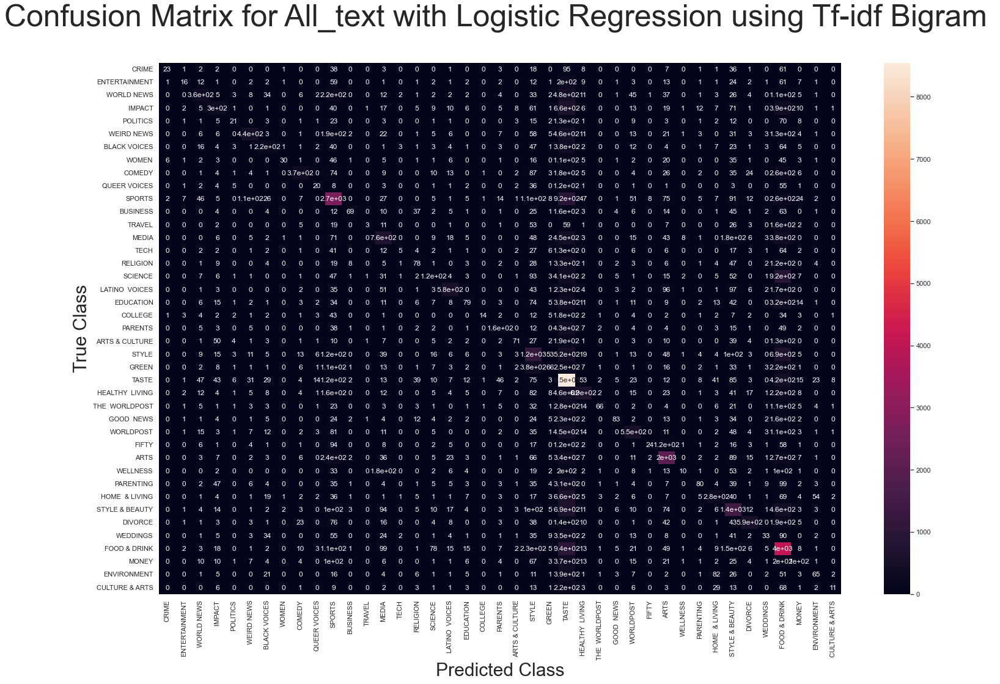

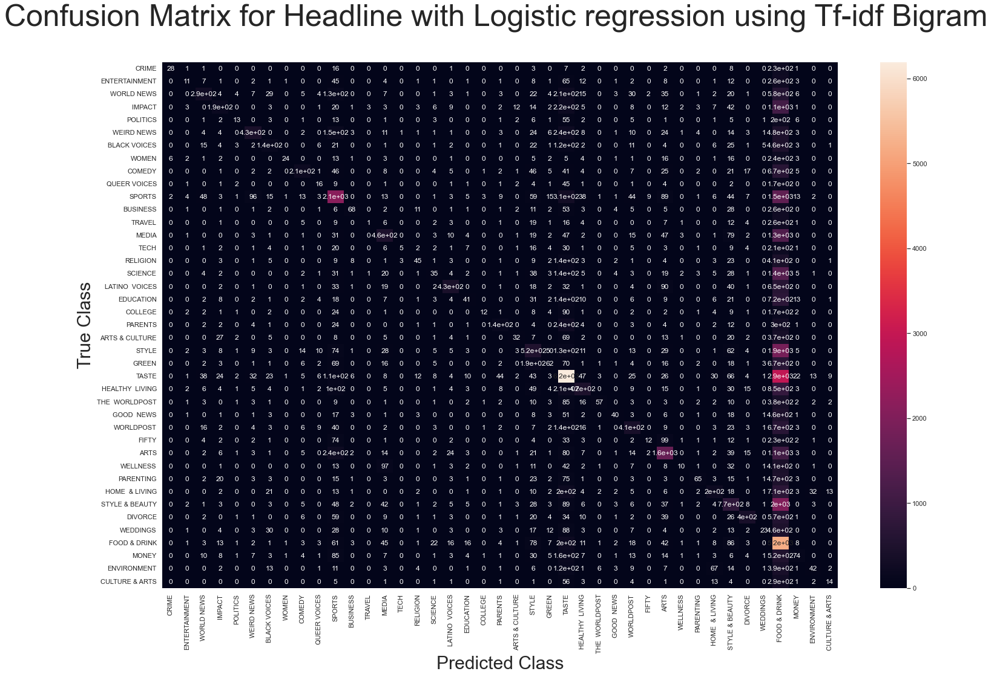

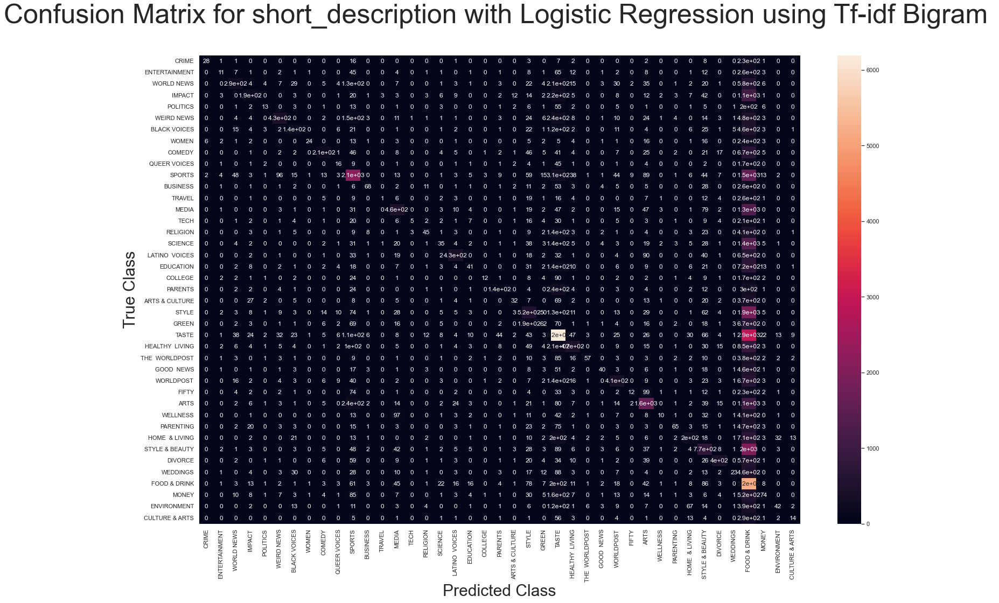

In [610]:
#                   Confusion Matrix for TF-IDF Bi-gram using LOgistic regression.




# For All_Text column
cf_matrix_alltext_tfidf_lr2 = confusion_matrix(y_test, y_predict_alltext_tfidf_lr2)
heatmap13 = sns.heatmap(cf_matrix_alltext_tfidf_lr2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text with Logistic Regression using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')


# For Headlines column
cf_matrix_headline_tfidf_lr2 = confusion_matrix(y_test, y_predict_headline_tfidf_lr2)
heatmap14 = sns.heatmap(cf_matrix_headline_tfidf_lr2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for Headline with Logistic regression using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')



# For Short_description column
cf_matrix_short_tfidf_lr2 = confusion_matrix(y_test, y_predict_short_tfidf_lr2)
heatmap15 = sns.heatmap(cf_matrix_short_tfidf_lr2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description with Logistic Regression using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())




## 6)c)

In [396]:
#                   LinearSVC Using Tf-Idf (Bigram) Vectorizer.




#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The last model that we are going to use is the LinearSVC model.

# The variables used are as follows : 

       # svc_alltext_tfidf2 = LinearSVC applied for the All_Text Column with tfidf Bigram Vectorizer.
       # svc_headline_tfidf2 = LinearSVC applied for the headlines Column with tfidf Bigram Vectorizer.
       # svc_short_tfidf2 = LinearSVC applied for the short_description column with tfidf Bigram Vectorizer.





svc_alltext_tfidf2 = LinearSVC()
svc_alltext_tfidf2.fit(x_train_alltext_tfidf2, y_train)


svc_headline_tfidf2 = LinearSVC()
svc_headline_tfidf2.fit(x_train_headline_tfidf2, y_train)


svc_short_tfidf2 = LinearSVC()
svc_short_tfidf2.fit(x_train_short_tfidf2, y_train)




LinearSVC()

In [829]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_tfidf_svc2 = prediction of the All_Text column (tfidf bigram) with LinearSVC.
#y_predict_headline_tfidf_svc2 = prediction of the headline column (tfidf bigram) with LinearSVC.
#y_predict_short_tfidf_svc2 = prediction of the short_description column (tfidf bigram) with LinearSVC.


y_predict_alltext_tfidf_svc2 = svc_alltext_tfidf2.predict(x_test_alltext_tfidf2)
y_predict_headline_tfidf_svc2 = svc_headline_tfidf2.predict(x_text_headline_tfidf2)
y_predict_short_tfidf_svc2 = svc_short_tfidf2.predict(x_test_short_tfidf2)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_tfidf_svc2 = accuracy of the All_Text column (tfidf bigram) with LinearSVC.
# accuracy_headline_tfidf_svc2 = accuracy of the headline column (tfidf bigram) with LinearSVC.
# accuracy_short_tfidf_svc2 = accuracy of the short_description column (tfidf bigram) with LinearSVC.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (tfidf bigram) with LinearSVC is :\n', accuracy_score(y_predict_alltext_tfidf_svc2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_tfidf_svc2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_alltext_tfidf2, x_train_alltext_tfidf2, y_train)))
score103 = (cross_val_score(svc_alltext_tfidf2, x_train_alltext_tfidf2, y_train))
print('mean of cross validation scores is ', score103.mean())
print('\n\n')
print('the accuracy of headline column (tfidf bigram) with LinearSVC is :\n', accuracy_score(y_predict_headline_tfidf_svc2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_tfidf_svc2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_alltext_tfidf2, x_train_alltext_tfidf2, y_train)))
score104 = (cross_val_score(svc_alltext_tfidf2, x_train_alltext_tfidf2, y_train))
print('mean of cross validation scores is ', score104.mean())
print('\n\n')
print('the accuracy of the short_description column (tfidf bigram) with LinearSVC is : \n', accuracy_score(y_predict_short_tfidf_svc2, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_tfidf_svc2, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_alltext_tfidf2, x_train_alltext_tfidf2, y_train)))
score105 = (cross_val_score(svc_alltext_tfidf2, x_train_alltext_tfidf2, y_train))
print('mean of cross validation scores is ', score105.mean())
print('\n\n')





the accuracy of the All_Text column (tfidf bigram) with LinearSVC is :
 0.4263175506106743
the percentage of accuracy is : 42.63175506106743 %
the cross validation scores are : [0.42707046 0.42327977 0.42262052 0.42740008 0.42410383]
mean of cross validation scores is  0.42489493201483314



the accuracy of headline column (tfidf bigram) with LinearSVC is :
 0.35193240756232225
the percentage of accuracy is : 35.19324075623223 %
the cross validation scores are : [0.42707046 0.42327977 0.42262052 0.42740008 0.42410383]
mean of cross validation scores is  0.42489493201483314



the accuracy of the short_description column (tfidf bigram) with LinearSVC is : 
 0.35193240756232225
the percentage of accuracy is : 35.19324075623223 %
the cross validation scores are : [0.42707046 0.42327977 0.42262052 0.42740008 0.42410383]
mean of cross validation scores is  0.42489493201483314





In [398]:
#                       Classification reports for TF-IDF bigram vector using LinearSVC.


# For All_text Column
print('\n')
print('      Classification Report for All_Text (tfidf bigram) using LinearSVC     \n ')
print(classification_report(y_predict_alltext_tfidf_svc2, y_test))


print('\n\n\n')


# For headlines column.
print('      Classification Report for headline (tfidf bigram) using LinearSVC     \n  ')
print(classification_report(y_predict_headline_tfidf_svc2, y_test))


print('\n\n\n')


# For short_description column.
print('      Classification Report for short_description (tfidf bigram) using LinearSVC     \n ')
print(classification_report(y_predict_short_tfidf_svc2, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.

      Classification Report for All_Text (tfidf bigram) using LinearSVC     
 
                precision    recall  f1-score   support

          ARTS       0.12      0.28      0.16       127
ARTS & CULTURE       0.09      0.19      0.12       208
  BLACK VOICES       0.32      0.42      0.36      1065
      BUSINESS       0.22      0.29      0.25      1287
       COLLEGE       0.11      0.21      0.14       165
        COMEDY       0.34      0.46      0.39      1036
         CRIME       0.33      0.35      0.34       811
CULTURE & ARTS       0.14      0.28      0.18       165
       DIVORCE       0.39      0.51      0.44       866
     EDUCATION       0.15      0.26      0.19       159
 ENTERTAINMENT       0.54      0.51      0.53      4783
   ENVIRONMENT       0.20      0.35      0.25       260
         FIFTY       0.05      0.12      0.06       138
  FOOD & DRINK       0.38      0.39      0.38      1990
     GOOD NEWS       0.05      0.13      0.07       126
         GREEN       0.1

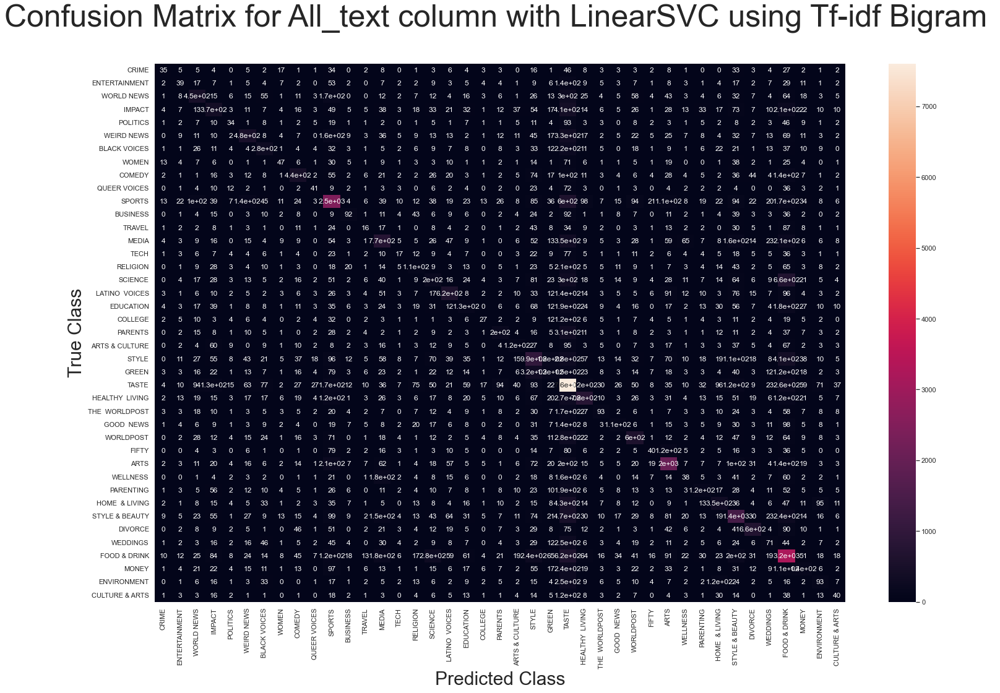

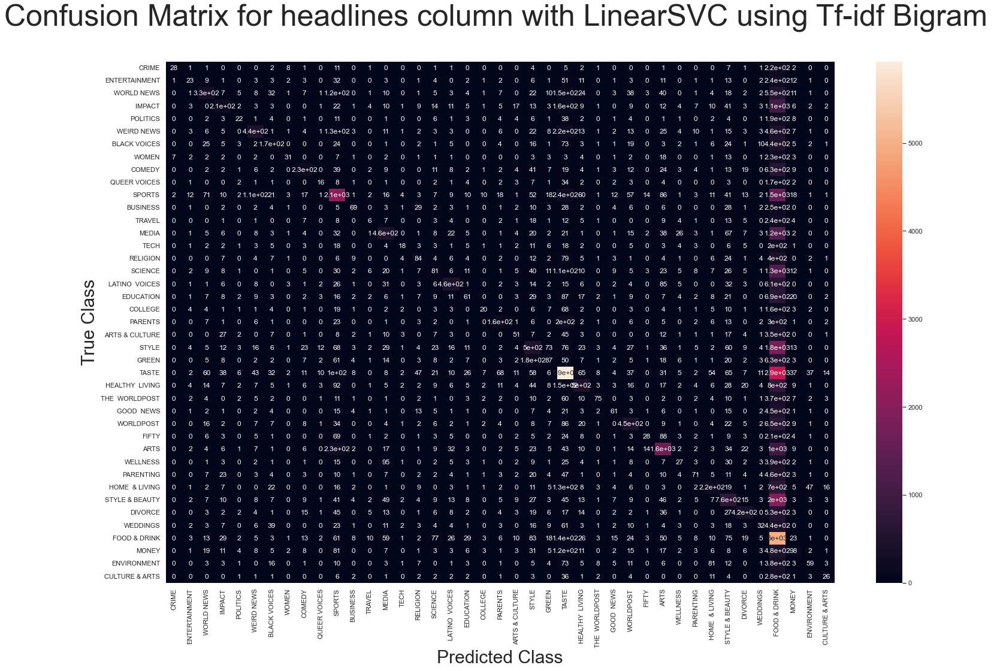

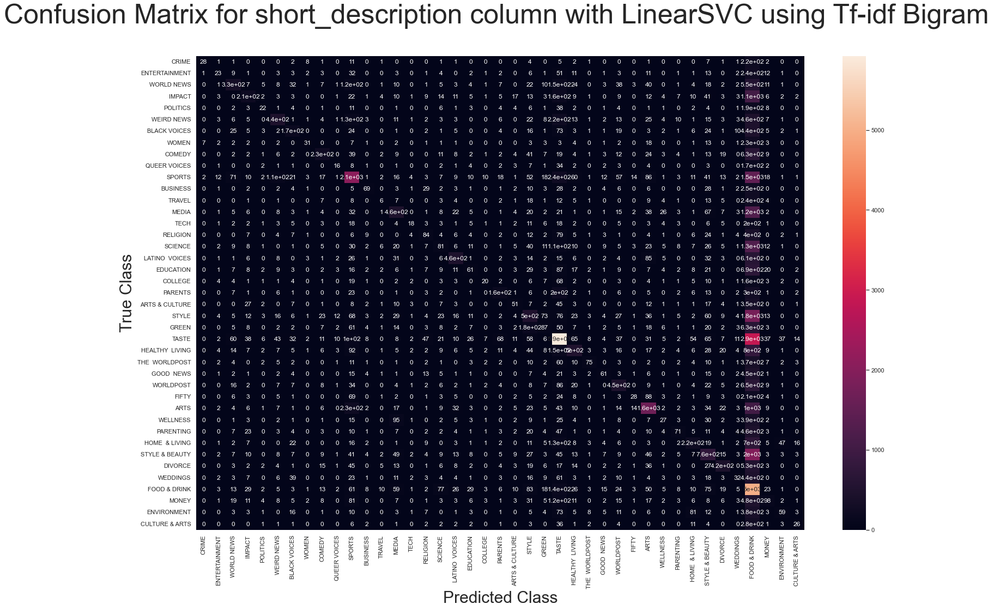

In [612]:
#                         Plotting the confusion Matrices.


# For All_text column
cf_matrix_alltext_tfidf_svc2 = confusion_matrix(y_test, y_predict_alltext_tfidf_svc2)
heatmap16 = sns.heatmap(cf_matrix_alltext_tfidf_svc2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text column with LinearSVC using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')


# For headline column
cf_matrix_headline_tfidf_svc2 = confusion_matrix(y_test, y_predict_headline_tfidf_svc2)
heatmap17 = sns.heatmap(cf_matrix_headline_tfidf_svc2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headlines column with LinearSVC using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())


print('\n\n')


# For short_description column
cf_matrix_short_tfidf_svc2 = confusion_matrix(y_test, y_predict_short_tfidf_svc2)
heatmap18 = sns.heatmap(cf_matrix_short_tfidf_svc2, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with LinearSVC using Tf-idf Bigram \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())





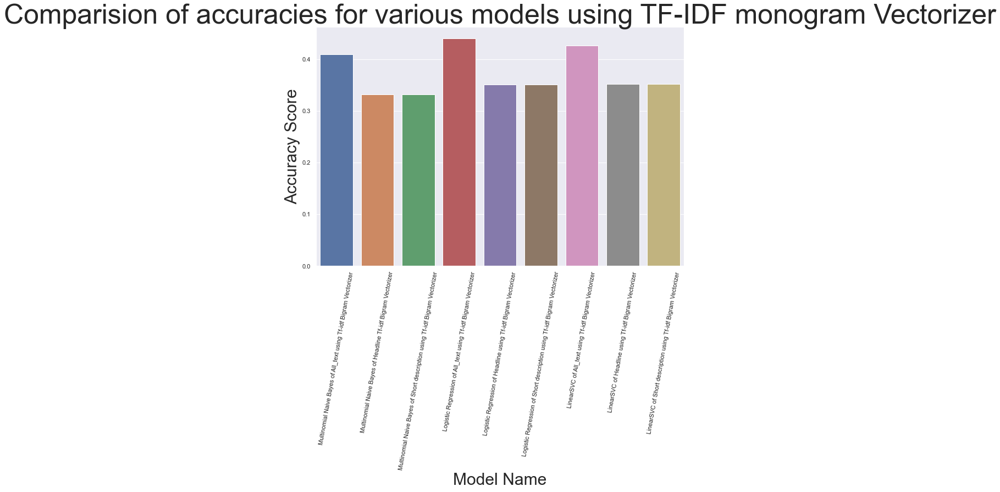

In [680]:
models_tfidf_bigram = ['Multinomial Naive Bayes of All_text using Tf-idf Bigram Vectorizer',
                             'Multinomial Naive Bayes of Headline Tf-idf Bigram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Tf-idf Bigramm Vectorizer',
                             'Logistic Regression of All_text using Tf-idf Bigram Vectorizer',
                             'Logistic Regression of Headline using Tf-idf Bigram Vectorizer',
                             'Logistic Regression of Short description using Tf-idf Bigram Vectorizer',
                             'LinearSVC of All_text using Tf-idf Bigram Vectorizer',
                             'LinearSVC of Headline using Tf-idf Bigram Vectorizer',
                             'LinearSVC of Short description using Tf-idf Bigram Vectorizer']


df3 = pd.DataFrame({'model':['Multinomial Naive Bayes of All_text using Tf-idf Bigram Vectorizer',
                             'Multinomial Naive Bayes of Headline Tf-idf Bigram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Tf-idf Bigram Vectorizer',
                             'Logistic Regression of All_text using Tf-idf Bigram Vectorizer',
                             'Logistic Regression of Headline using Tf-idf Bigram Vectorizer',
                             'Logistic Regression of Short description using Tf-idf Bigram Vectorizer',
                             'LinearSVC of All_text using Tf-idf Bigram Vectorizer',
                             'LinearSVC of Headline using Tf-idf Bigram Vectorizer',
                             'LinearSVC of Short description using Tf-idf Bigram Vectorizer'], 
                    'val':  [accuracy_score(y_predict_alltext_tfidf_mb2, y_test),
                            accuracy_score(y_predict_headline_tfidf_mb2, y_test),
                            accuracy_score(y_predict_short_tfidf_mb2, y_test),
                            accuracy_score(y_predict_alltext_tfidf_lr2, y_test),
                            accuracy_score(y_predict_headline_tfidf_lr2, y_test),
                            accuracy_score(y_predict_short_tfidf_lr2, y_test),
                            accuracy_score(y_predict_alltext_tfidf_svc2, y_test),
                            accuracy_score(y_predict_headline_tfidf_svc2, y_test),
                            accuracy_score(y_predict_short_tfidf_svc2, y_test)]} , index= models_tfidf_bigram)


plotdata = df3
plt.figure(figsize=(12, 8))
sns.barplot(df3['model'], df3['val'])
plt.title("Comparision of accuracies for various models using TF-IDF monogram Vectorizer", fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.xlabel("Model Name",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.ylabel("Accuracy Score",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.xticks(rotation = 80)
plt.show()

# 7) Machine Learning Model Using CountVectorizer Uni and bi-gram Vectorizer.

In [617]:
vect12 = CountVectorizer(ngram_range=(1,2), max_df=0.8, min_df=10)


#here we have made the max_df = 0.8 which means to ignore words that repeat more than 80 percent of the time.
#min_df is set to be 10, which means to ignore the words that appeared less than 10 times in the dataset.
x_train_alltext_count12 = vect12.fit_transform(x_train)
x_test_alltext_count12 = vect12.transform(x_test)



In [618]:
#Now we do the same for the headlines column.
#we are using the same vectorizer that we have used for the All_Text column.

x_train_headline_count12 = vect12.fit_transform(x_train_headline)
x_test_headline_count12 = vect12.transform(x_test_headline)

In [619]:
#Now we do the same for the headlines column.
#we are using the same vectorizer that we have used for the All_Text column.

x_train_short_count12 = vect12.fit_transform(x_train_short)
x_test_short_count12 = vect12.transform(x_test_short)

In [621]:
print(x_train_alltext_count12.shape)
print(x_train_headline_count12.shape)
print(x_train_short_count12.shape)
print(x_test_short_count12.shape)
print(y_test.shape)

(121350, 30169)
(121350, 12419)
(121350, 19945)
(59770, 19945)
(59770,)


## 7)a)

In [622]:
#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The first model that we are going to use is the Multinomial Naive Bayes Model.



# mb_alltext_count12 = Multinomial applied for the All_Text Column with Count Uni and Bigram Vectorizer.
# mb_headline_count12 = Multinomial applied for the headlines Column with Count Uni and Bigram Vectorizer.
# mb_short_count12 = Multinomial applied for the short_description column with Count Uni and Bigram Vectorizer.

from sklearn.naive_bayes import MultinomialNB

mb_alltext_count12 = MultinomialNB()
mb_alltext_count12.fit(x_train_alltext_count12, y_train)


mb_headline_count12 = MultinomialNB()
mb_headline_count12.fit(x_train_headline_count12, y_train)


mb_short_count12 = MultinomialNB()
mb_short_count12.fit(x_train_short_count12, y_train)



MultinomialNB()

In [831]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_count_mb12 = prediction of the All_Text column (Count Uni and Bigram Vectorizer) with multinomial naive bayes.
#y_predict_headline_tfidf_mb12 = prediction of the headline column (Count Uni and Bigram Vectorizer) with multinomial naive bayes.
#y_predict_short_count_mb12 = prediction of the short_description column (Count Uni and Bigram Vectorizer) with multinomial naive bayes.


y_predict_alltext_count_mb12 = mb_alltext_count12.predict(x_test_alltext_count12)
y_predict_headline_count_mb12 = mb_headline_count12.predict(x_test_headline_count12)
y_predict_short_count_mb12 = mb_short_count12.predict(x_test_short_count12)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_count_mb12 = accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with multinomial naive bayes.
# accuracy_headline_count_mb12 = accuracy of the headline column (Count Uni and Bigram Vectorizer) with multinomial naive bayes.
# accuracy_short_count_mb12 = accuracy of the short_description column (Count Uni and Bigram Vectorizer) with multinomial naive bayes.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with MultinomialNB is :\n', accuracy_score(y_predict_alltext_count_mb12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_count_mb12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_alltext_count12, x_train_alltext_count12, y_train)))
score201 = (cross_val_score(mb_alltext_count12, x_train_alltext_count12, y_train))
print('mean of cross validation scores is ', score201.mean())
print('\n\n')
print('the accuracy of headline column (Count Uni and Bigram Vectorizer) with MultinomialNB is :\n', accuracy_score(y_predict_headline_count_mb12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_count_mb12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_headline_count12, x_train_headline_count12, y_train)))
score202 = (cross_val_score(lr_headline_count12, x_train_headline_count12, y_train))
print('mean of cross validation scores is ', score202.mean())
print('\n\n')
print('the accuracy of the short_description column (Count Uni and Bigram Vectorizer) with MultinomialNB is : \n', accuracy_score(y_predict_short_count_mb12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_count_mb12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(mb_short_count12, x_train_short_count12, y_train)))
score203 = (cross_val_score(lr_short_count12, x_train_short_count12, y_train))
print('mean of cross validation scores is ', score203.mean())
print('\n\n')



the accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with MultinomialNB is :
 0.5959511460598963
the percentage of accuracy is : 59.59511460598963 %
the cross validation scores are : [0.59270705 0.5881747  0.59270705 0.59188298 0.59542645]
mean of cross validation scores is  0.5921796456530697



the accuracy of headline column (Count Uni and Bigram Vectorizer) with MultinomialNB is :
 0.5658022419273884
the percentage of accuracy is : 56.58022419273884 %
the cross validation scores are : [0.55945612 0.55723115 0.55727235 0.55776679 0.56003296]
mean of cross validation scores is  0.5791017717346518



the accuracy of the short_description column (Count Uni and Bigram Vectorizer) with MultinomialNB is : 
 0.45233394679605154
the percentage of accuracy is : 45.233394679605155 %
the cross validation scores are : [0.44960857 0.44725999 0.44536465 0.45022662 0.44829007]
mean of cross validation scores is  0.4482076637824474





In [624]:
#                       Printing the classification reports.

# Report for All_text
print('      Classification Report for All_Text (Count Uni and Bigram Vectorizer) using Multinomial Naive Bayes     \n ')
print(classification_report(y_predict_alltext_count_mb12, y_test))


print('\n\n\n')


# Report for Headlines column
print('      Classification Report for headline (Count Uni and Bigram Vectorizer) using Multinomial Naive Bayes   \n  ')
print(classification_report(y_predict_headline_count_mb12, y_test))


print('\n\n\n')


# Report for short_description column
print('      Classification Report for short_description (Count Uni and Bigram Vectorizer) using Multinomial Naive Bayes     \n ')
print(classification_report(y_predict_short_count_mb12, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.

      Classification Report for All_Text (Count Uni and Bigram Vectorizer) using Multinomial Naive Bayes     
 
                precision    recall  f1-score   support

          ARTS       0.09      0.49      0.15        55
ARTS & CULTURE       0.06      0.62      0.10        40
  BLACK VOICES       0.37      0.53      0.44       996
      BUSINESS       0.52      0.41      0.46      2130
       COLLEGE       0.15      0.53      0.23        90
        COMEDY       0.45      0.53      0.48      1208
         CRIME       0.68      0.43      0.53      1344
CULTURE & ARTS       0.23      0.68      0.35       117
       DIVORCE       0.66      0.76      0.71       973
     EDUCATION       0.16      0.39      0.22       107
 ENTERTAINMENT       0.74      0.60      0.66      5537
   ENVIRONMENT       0.18      0.66      0.28       127
         FIFTY       0.04      0.56      0.08        27
  FOOD & DRINK       0.79      0.59      0.68      2708
     GOOD NEWS       0.08      0.59      0.14  

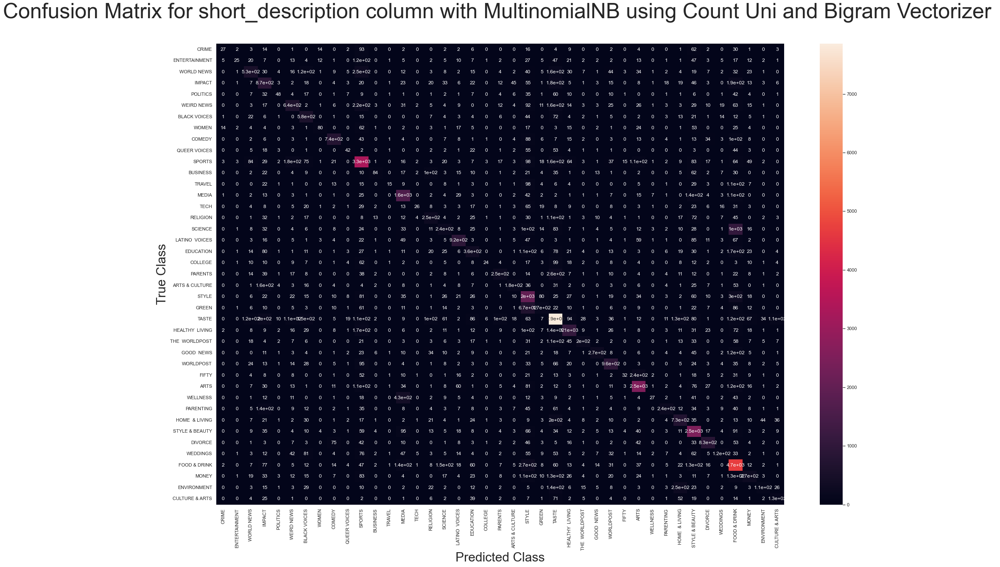

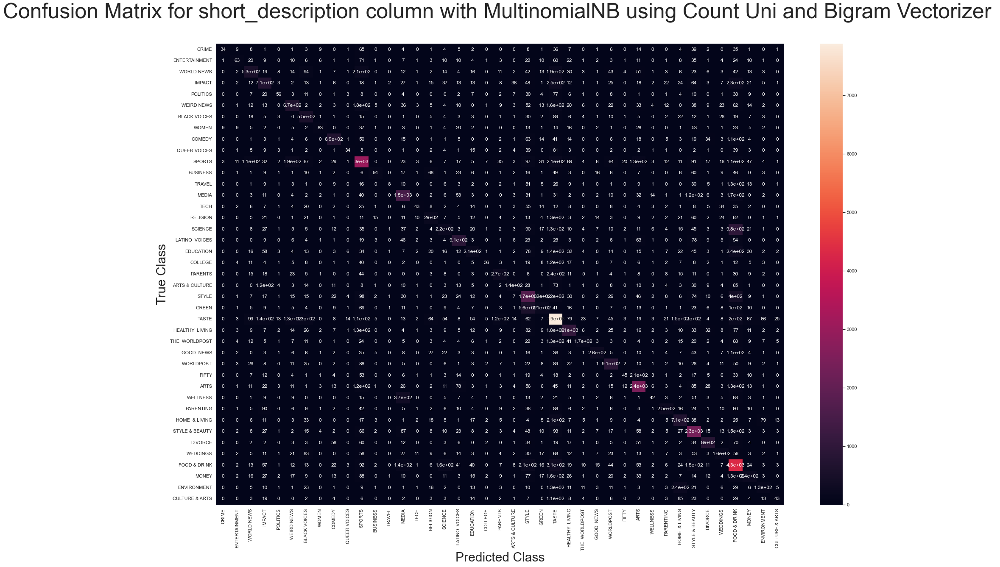

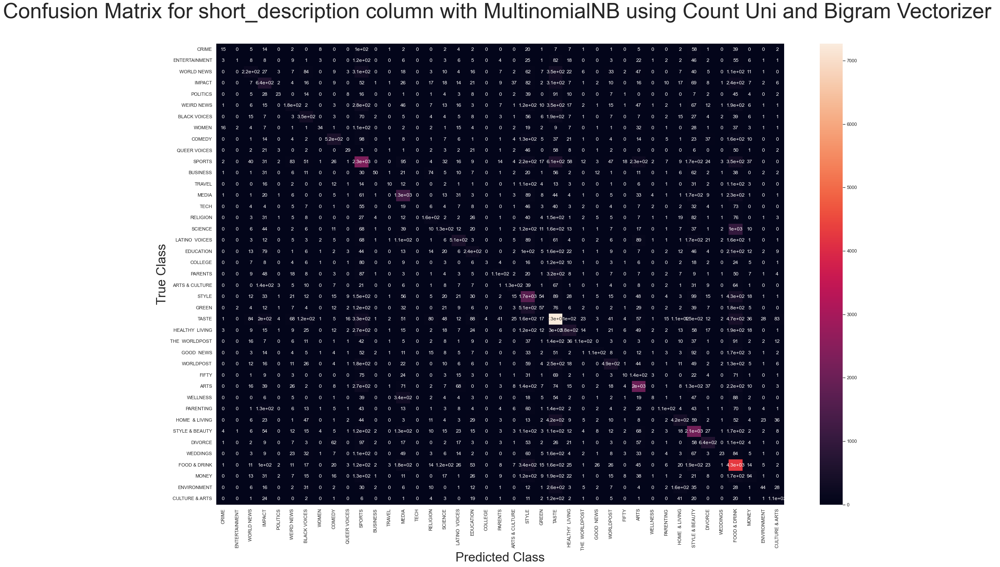

In [626]:
#                          Plotting the confusion matrix.


# For All_text column
cf_matrix_alltext_count_mb12 = confusion_matrix(y_test, y_predict_alltext_count_mb12)
plt.figure(figsize=(30,20))
heatmap20 = sns.heatmap(cf_matrix_alltext_count_mb12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with MultinomialNB using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')


# For headline column
cf_matrix_headline_count_mb12 = confusion_matrix(y_test, y_predict_headline_count_mb12)
plt.figure(figsize=(30,20))
heatmap21 = sns.heatmap(cf_matrix_headline_count_mb12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with MultinomialNB using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')



# For short_description column
cf_matrix_short_count_mb12 = confusion_matrix(y_test, y_predict_short_count_mb12)
plt.figure(figsize=(30,20))
heatmap22 = sns.heatmap(cf_matrix_short_count_mb12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with MultinomialNB using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())






## 7)b)

In [631]:
#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The second model that we are going to use is the Logistic Regression Model.



# lr_alltext_count12 = Logistic Regression applied for the All_Text Column with Count Uni and Bigram Vectorizer.
# lr_headline_count12 =Logistic Regression applied for the headlines Column with Count Uni and Bigram Vectorizer.
# lr_short_count12 = Logistic Regression applied for the short_description column with Count Uni and Bigram Vectorizer.


lr_alltext_count12 = LogisticRegression()
lr_alltext_count12.fit(x_train_alltext_count12, y_train)


lr_headline_count12 = LogisticRegression()
lr_headline_count12.fit(x_train_headline_count12, y_train)


lr_short_count12 = LogisticRegression()
lr_short_count12.fit(x_train_short_count12, y_train)




LogisticRegression()

In [832]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_count_lr2 = prediction of the All_Text column (Count Uni and Bigram Vectorizer) with Logistic Regression.
#y_predict_headline_count_lr2 = prediction of the headline column (Count Uni and Bigram Vectorizer) with Logistic Regression.
#y_predict_short_count_lr2 = prediction of the short_description column (Count Uni and Bigram Vectorizer) with Logistic Regression.


y_predict_alltext_count_lr12 = lr_alltext_count12.predict(x_test_alltext_count12)
y_predict_headline_count_lr12 = lr_headline_count12.predict(x_test_headline_count12)
y_predict_short_count_lr12 = lr_short_count12.predict(x_test_short_count12)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_count_lr12 = accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with Logistic Regression.
# accuracy_headline_count_lr12 = accuracy of the headline column (Count Uni and Bigram Vectorizer) with Logistic Regressions.
# accuracy_short_count_lr12 = accuracy of the short_description column (Count Uni and Bigram Vectorizer) with Logistic Regression.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with Logistic Regression is :\n', accuracy_score(y_predict_alltext_count_lr12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_count_lr12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_alltext_count12, x_train_alltext_count12, y_train)))
score301 = (cross_val_score(lr_alltext_count12, x_train_alltext_count12, y_train))
print('mean of cross validation scores is ', score301.mean())
print('\n\n')
print('the accuracy of headline column (Count Uni and Bigram Vectorizer) with Logistic Regression is :\n', accuracy_score(y_predict_headline_count_lr12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_count_lr12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_headline_count12, x_train_headline_count12, y_train)))
score302 = (cross_val_score(lr_headline_count12, x_train_headline_count12, y_train))
print('mean of cross validation scores is ', score302.mean())
print('\n\n')
print('the accuracy of the short_description column (Count Uni and Bigram Vectorizer) with Logistic Regression is : \n', accuracy_score(y_predict_short_count_lr12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_count_lr12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(lr_short_count12, x_train_short_count12, y_train)))
score303 = (cross_val_score(lr_short_count12, x_train_short_count12, y_train))
print('mean of cross validation scores is ', score303.mean())
print('\n\n')




the accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with Logistic Regression is :
 0.6013551949138364
the percentage of accuracy is : 60.13551949138364 %
the cross validation scores are : [0.59975278 0.59810466 0.59550886 0.59843428 0.60218377]
mean of cross validation scores is  0.5987968685620106



the accuracy of headline column (Count Uni and Bigram Vectorizer) with Logistic Regression is :
 0.5859628576208801
the percentage of accuracy is : 58.59628576208801 %
the cross validation scores are : [0.57667903 0.57939843 0.57791512 0.58215904 0.57935723]
mean of cross validation scores is  0.5791017717346518



the accuracy of the short_description column (Count Uni and Bigram Vectorizer) with Logistic Regression is : 
 0.45589760749539904
the percentage of accuracy is : 45.589760749539906 %
the cross validation scores are : [0.4513391  0.44804285 0.44491141 0.44775443 0.44899052]
mean of cross validation scores is  0.4482076637824474





In [633]:
#                            Printing the classification reports



# For All_text column
print('\n')
print('      Classification Report for All_Text (Count Uni and Bigram Vectorizer) using Logistic Regression     \n ')
print(classification_report(y_predict_alltext_count_lr12, y_test))


print('\n\n\n')


# For headlines column
print('      Classification Report for headline (Count Uni and Bigram Vectorizer) using Logistic Regression    \n  ')
print(classification_report(y_predict_headline_count_lr12, y_test))


print('\n\n\n')


# For short_description column
print('      Classification Report for short_description (Count Uni and Bigram Vectorizer) using Logistic Regression      \n ')
print(classification_report(y_predict_short_count_lr12, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (Count Uni and Bigram Vectorizer) using Logistic Regression     
 
                precision    recall  f1-score   support

          ARTS       0.23      0.41      0.29       168
ARTS & CULTURE       0.29      0.41      0.34       313
  BLACK VOICES       0.42      0.51      0.46      1148
      BUSINESS       0.46      0.45      0.45      1680
       COLLEGE       0.34      0.50      0.40       216
        COMEDY       0.46      0.53      0.49      1257
         CRIME       0.51      0.50      0.50       863
CULTURE & ARTS       0.35      0.54      0.42       223
       DIVORCE       0.70      0.81      0.75       963
     EDUCATION       0.30      0.44      0.35       180
 ENTERTAINMENT       0.72      0.62      0.66      5291
   ENVIRONMENT       0.32      0.57      0.41       261
         FIFTY       0.19      0.34      0.25       200
  FOOD & DRINK       0.69      0.63      0.66      2206
     GOOD NEWS       0.20      0.33      0.25    

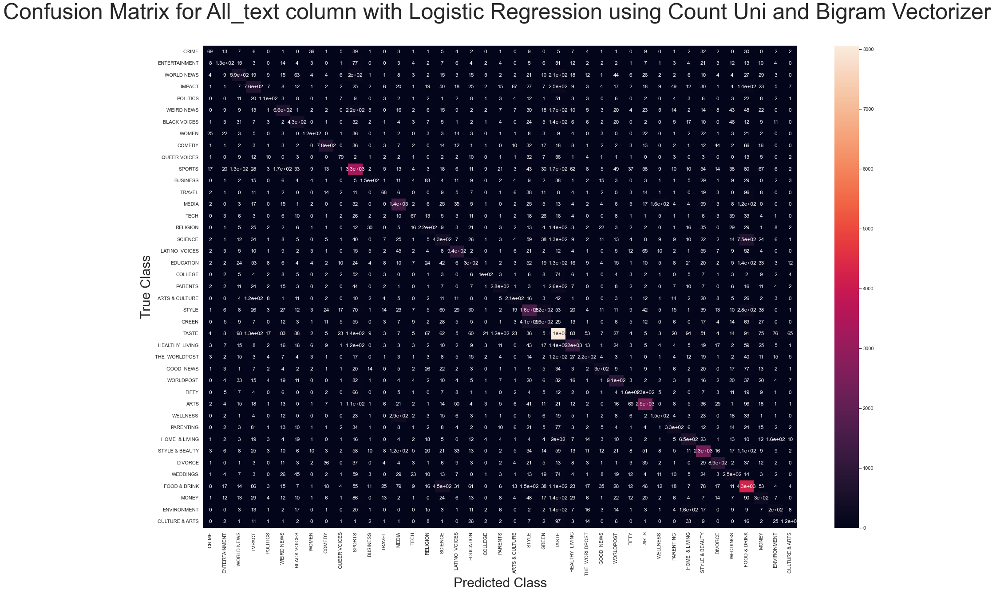

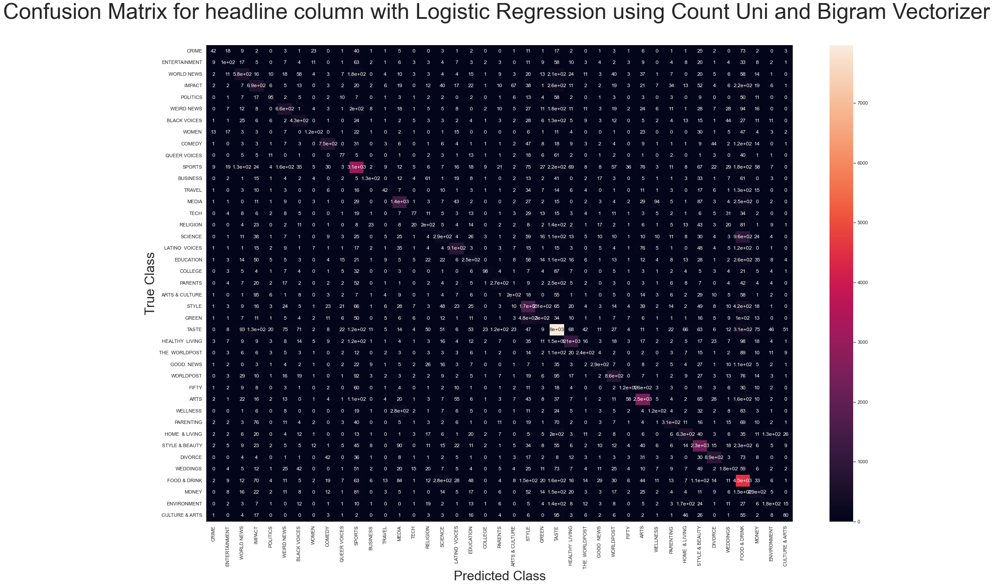

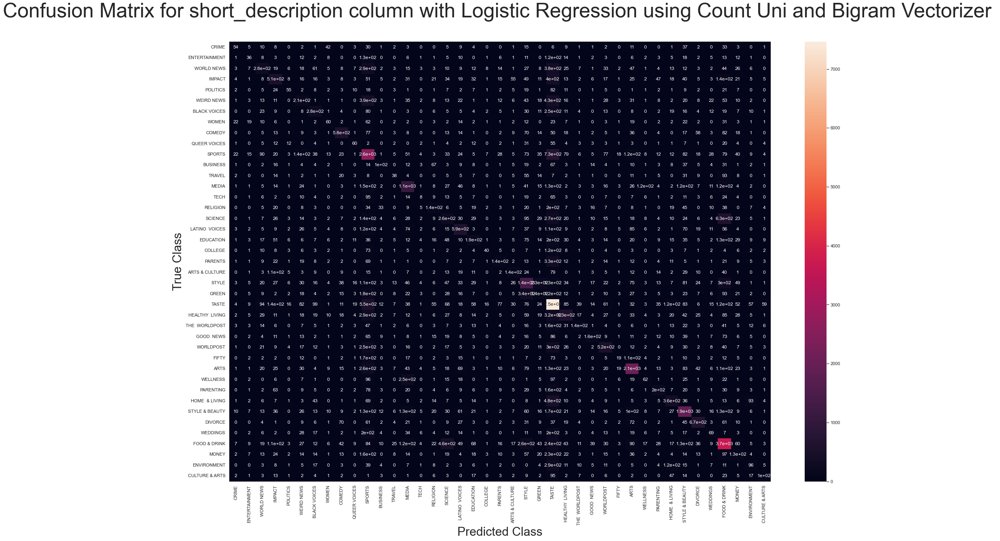

In [666]:
#                        Plotting the confusion matrices.


# For All_text column
cf_matrix_alltext_count_lr12 = confusion_matrix(y_test, y_predict_alltext_count_lr12)
plt.figure(figsize=(30,20))
heatmap27 = sns.heatmap(cf_matrix_alltext_count_lr12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text column with Logistic Regression using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n\n')


# For headlines column
cf_matrix_headline_count_lr12 = confusion_matrix(y_test, y_predict_headline_count_lr12)
plt.figure(figsize=(30,20))
heatmap28 = sns.heatmap(cf_matrix_headline_count_lr12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headline column with Logistic Regression using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n\n')



# For short_description column.
cf_matrix_short_count_lr12 = confusion_matrix(y_test, y_predict_short_count_lr12)
plt.figure(figsize=(30,20))
heatmap29 = sns.heatmap(cf_matrix_short_count_lr12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with Logistic Regression using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())







## 7)c)

In [636]:
#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The last model that we are going to use is the LinearSVC model.



# svc_alltext_count12 = LinearSVC applied for the All_Text Column with Count Uni and Bigram Vectorizer.
# svc_headline_count12 =LinearSVC applied for the headlines Column with Count Uni and Bigram Vectorizer.
# svc_short_count12 = LinearSVC applied for the short_description column with Count Uni and Bigram Vectorizer.


svc_alltext_count12 = LinearSVC()
svc_alltext_count12.fit(x_train_alltext_count12, y_train)


svc_headline_count12 = LinearSVC()
svc_headline_count12.fit(x_train_headline_count12, y_train)


svc_short_count12 = LinearSVC()
svc_short_count12.fit(x_train_short_count12, y_train)




LinearSVC()

In [833]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_count_svc12 = prediction of the All_Text column (Count Uni and Bigram Vectorizer) with LinearSVC.
#y_predict_headline_count_svc12 = prediction of the headline column (Count Uni and Bigram Vectorizer) with LinearSVC.
#y_predict_short_count_svc12 = prediction of the short_description column (Count Uni and Bigram Vectorizer) with LinearSVC.


y_predict_alltext_count_svc12 = svc_alltext_count12.predict(x_test_alltext_count12)
y_predict_headline_count_svc12 = svc_headline_count12.predict(x_test_headline_count12)
y_predict_short_count_svc12 = svc_short_count12.predict(x_test_short_count12)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_count_svc12 = accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with LinearSVC.
# accuracy_headline_count_svc12 = accuracy of the headline column (Count Uni and Bigram Vectorizer) with LinearSVC.
# accuracy_short_count_svc12 = accuracy of the short_description column (Count Uni and Bigram Vectorizer) with LinearSVC.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with LinearSVC is :\n', accuracy_score(y_predict_alltext_count_svc12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_count_svc12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_alltext_count12, x_train_alltext_count12, y_train)))
score401 = (cross_val_score(svc_alltext_count12, x_train_alltext_count12, y_train))
print('mean of cross validation scores is ', score401.mean())
print('\n\n')
print('the accuracy of headline column (Count Uni and Bigram Vectorizer) with LinearSVC is :\n', accuracy_score(y_predict_headline_count_svc12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_count_svc12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_alltext_count12, x_train_alltext_count12, y_train)))
score402 = (cross_val_score(svc_headline_count12, x_train_headline_count12, y_train))
print('mean of cross validation scores is ', score402.mean())
print('\n\n')
print('the accuracy of the short_description column (Count Uni and Bigram Vectorizer) with LinearSVC is : \n', accuracy_score(y_predict_short_count_svc12, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_count_svc12, y_test)*100, '%')
print('the cross validation scores are :',(cross_val_score(svc_alltext_count12, x_train_alltext_count12, y_train)))
score403 = (cross_val_score(svc_short_count12, x_train_short_count12, y_train))
print('mean of cross validation scores is ', score403.mean())
print('\n\n')





the accuracy of the All_Text column (Count Uni and Bigram Vectorizer) with LinearSVC is :
 0.5452902794043835
the percentage of accuracy is : 54.52902794043835 %
the cross validation scores are : [0.53897816 0.53856613 0.53728883 0.54375773 0.5421508 ]
mean of cross validation scores is  0.5401318500206015



the accuracy of headline column (Count Uni and Bigram Vectorizer) with LinearSVC is :
 0.5603480006692321
the percentage of accuracy is : 56.03480006692321 %
the cross validation scores are : [0.53897816 0.53856613 0.53728883 0.54375773 0.5421508 ]
mean of cross validation scores is  0.5485290482076638



the accuracy of the short_description column (Count Uni and Bigram Vectorizer) with LinearSVC is : 
 0.39861134348335286
the percentage of accuracy is : 39.861134348335284 %
the cross validation scores are : [0.53897816 0.53856613 0.53728883 0.54375773 0.5421508 ]
mean of cross validation scores is  0.3872270292542233





In [638]:
#                       Printing the classification reports.



# For All_text column
print('\n')
print('      Classification Report for All_Text (Count Uni and Bigram Vectorizer) using LinearSVC     \n ')
print(classification_report(y_predict_alltext_count_svc12, y_test))


print('\n\n\n')


# For headlines column
print('      Classification Report for headline (Count Uni and Bigram Vectorizer) using LinearSVC   \n  ')
print(classification_report(y_predict_headline_count_svc12, y_test))


print('\n\n\n')


# For short_description column
print('      Classification Report for short_description (Count Uni and Bigram Vectorizer) using LinearSVC     \n ')
print(classification_report(y_predict_short_count_svc12, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (Count Uni and Bigram Vectorizer) using LinearSVC     
 
                precision    recall  f1-score   support

          ARTS       0.20      0.29      0.24       205
ARTS & CULTURE       0.25      0.28      0.26       394
  BLACK VOICES       0.39      0.43      0.41      1286
      BUSINESS       0.39      0.37      0.38      1740
       COLLEGE       0.28      0.37      0.32       249
        COMEDY       0.43      0.41      0.42      1490
         CRIME       0.46      0.43      0.44       900
CULTURE & ARTS       0.33      0.43      0.37       267
       DIVORCE       0.70      0.73      0.71      1076
     EDUCATION       0.27      0.29      0.28       242
 ENTERTAINMENT       0.63      0.60      0.62      4746
   ENVIRONMENT       0.29      0.43      0.35       317
         FIFTY       0.17      0.24      0.20       246
  FOOD & DRINK       0.62      0.59      0.60      2130
     GOOD NEWS       0.18      0.20      0.19       307
   

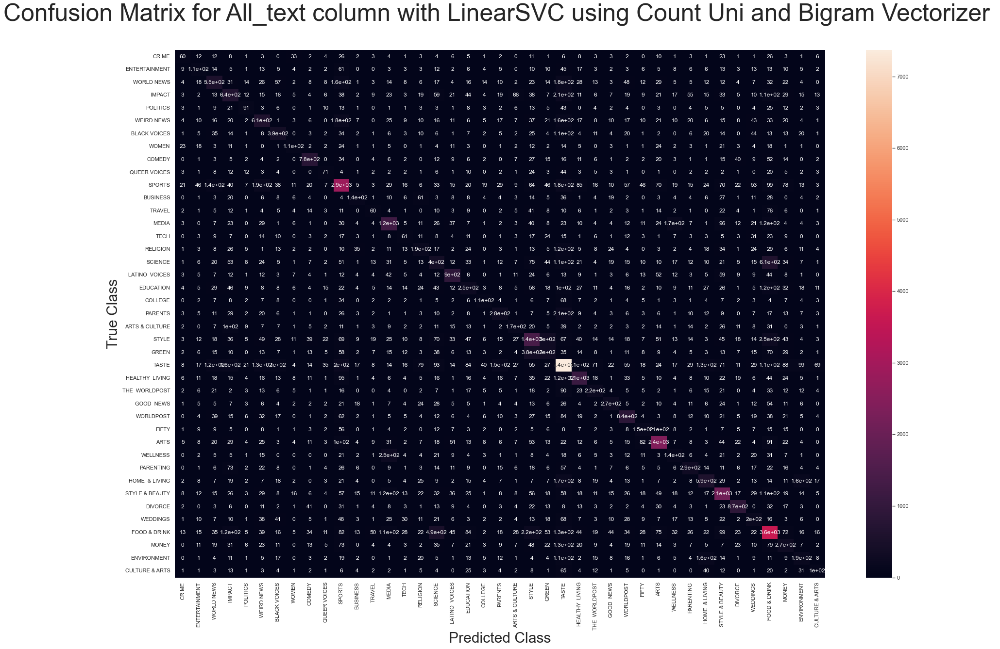

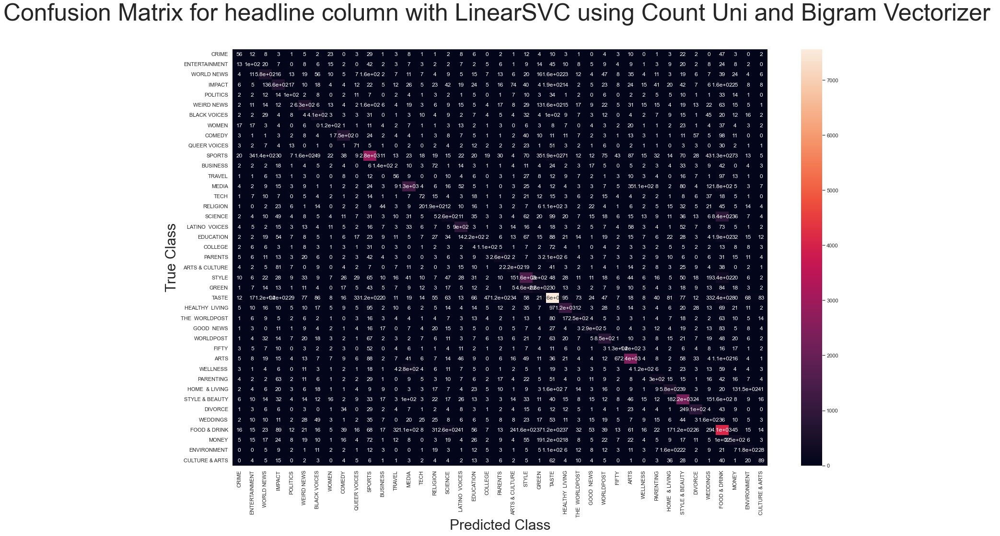

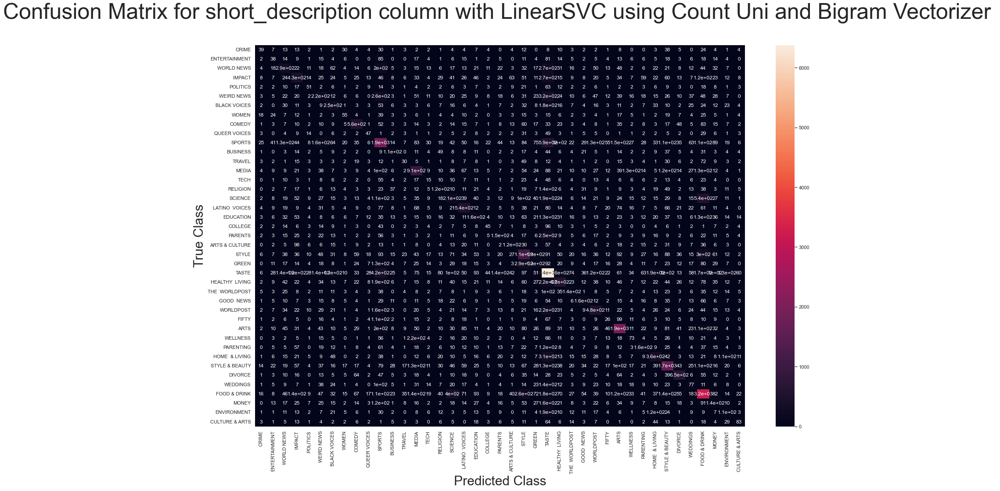

In [664]:
#                               Plotting the confusion matrices


# For All_text column
cf_matrix_alltext_count_svc12 = confusion_matrix(y_test, y_predict_alltext_count_svc12)
plt.figure(figsize=(30,20))
heatmap33 = sns.heatmap(cf_matrix_alltext_count_svc12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text column with LinearSVC using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n\n')


# For headline column
cf_matrix_headline_count_svc12 = confusion_matrix(y_test, y_predict_headline_count_svc12)
heatmap34 = sns.heatmap(cf_matrix_headline_count_svc12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headline column with LinearSVC using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n\n')


# For short_description column
cf_matrix_short_count_svc12 = confusion_matrix(y_test, y_predict_short_count_svc12)
heatmap29 = sns.heatmap(cf_matrix_short_count_svc12, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with LinearSVC using Count Uni and Bigram Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())







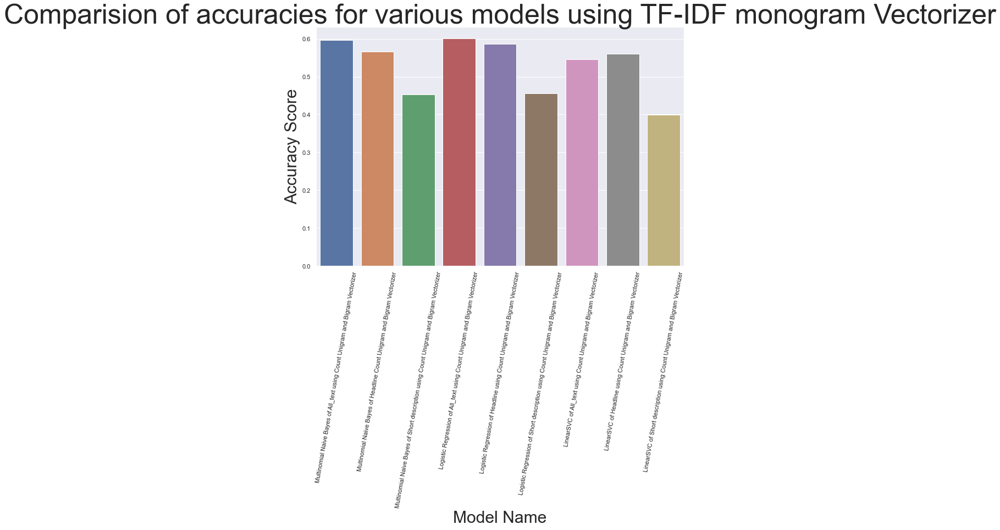

In [681]:
models_count_unibigram = ['Multinomial Naive Bayes of All_text using Count Unigram and Bigram Vectorizer',
                             'Multinomial Naive Bayes of Headline Count Unigram and Bigram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Count Unigram and Bigram Vectorizer',
                             'Logistic Regression of All_text using Count Unigram and Bigramm Vectorizer',
                             'Logistic Regression of Headline using Count Unigram and Bigram Vectorizer',
                             'Logistic Regression of Short description using Count Unigram and Bigram Vectorizer',
                             'LinearSVC of All_text using Count Unigram and Bigram Vectorizer',
                             'LinearSVC of Headline using Count Unigram and Bigram Vectorizer',
                             'LinearSVC of Short description using Count Unigram and Bigram Vectorizer']


df4 = pd.DataFrame({'model':['Multinomial Naive Bayes of All_text using Count Unigram and Bigram Vectorizer',
                             'Multinomial Naive Bayes of Headline Count Unigram and Bigram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Count Unigram and Bigram Vectorizer',
                             'Logistic Regression of All_text using Count Unigram and Bigram Vectorizer',
                             'Logistic Regression of Headline using Count Unigram and Bigram Vectorizer',
                             'Logistic Regression of Short description using Count Unigram and Bigram Vectorizer',
                             'LinearSVC of All_text using Count Unigram and Bigram Vectorizer',
                             'LinearSVC of Headline using Count Unigram and Bigram Vectorizer',
                             'LinearSVC of Short description using Count Unigram and Bigram Vectorizer'], 
                    'val':  [accuracy_score(y_predict_alltext_count_mb12, y_test),
                            accuracy_score(y_predict_headline_count_mb12, y_test),
                            accuracy_score(y_predict_short_count_mb12, y_test),
                            accuracy_score(y_predict_alltext_count_lr12, y_test),
                            accuracy_score(y_predict_headline_count_lr12, y_test),
                            accuracy_score(y_predict_short_count_lr12, y_test),
                            accuracy_score(y_predict_alltext_count_svc12, y_test),
                            accuracy_score(y_predict_headline_count_svc12, y_test),
                            accuracy_score(y_predict_short_count_svc12, y_test)]} , index= models_count_unibigram)


plotdata = df4
plt.figure(figsize=(12, 8))
sns.barplot(df4['model'], df4['val'])
plt.title("Comparision of accuracies for various models using TF-IDF monogram Vectorizer", fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.xlabel("Model Name",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.ylabel("Accuracy Score",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.xticks(rotation = 80)
plt.show()

# 8) Machine Learning Model Using Hashing Vectorizer

In [475]:
from sklearn.feature_extraction.text import HashingVectorizer

In [589]:
vect_h = HashingVectorizer(alternate_sign= False, n_features=10000)


#here we have made the max_df = 0.8 which means to ignore words that repeat more than 80 percent of the time.
#min_df is set to be 10, which means to ignore the words that appeared less than 10 times in the dataset.
x_train_alltext_hash = vect_h.fit_transform(x_train)
x_test_alltext_hash = vect_h.transform(x_test)




In [590]:
#Now we do the same for the headlines column.
#we are using the same vectorizer that we have used for the All_Text column.

x_train_headline_hash = vect_h.fit_transform(x_train_headline)
x_test_headline_hash = vect_h.transform(x_test_headline)

In [591]:
#Now we do the same for the headlines column.
#we are using the same vectorizer that we have used for the All_Text column.

x_train_short_hash = vect_h.fit_transform(x_train_short)
x_test_short_hash = vect_h.transform(x_test_short)

In [592]:
print(x_train_alltext_hash.shape)
print(x_train_headline_hash.shape)
print(x_train_short_hash.shape)
print(x_test_short_hash.shape)
print(y_test.shape)

(121350, 10000)
(121350, 10000)
(121350, 10000)
(59770, 10000)
(59770,)


## 8)a)

In [528]:
#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The first model that we are going to use is the Multinomial Naive Bayes Model.



# svc_alltext_hash = MultinomailNB applied for the All_Text Column with hash Vectorizer.
# svc_headline_hash = MultinomailNB applied for the headlines Column with hash Vectorizer.
# svc_short_hash = MultinomailNB applied for the short_description column with hash Vectorizer.


mb_alltext_hash = MultinomialNB()
mb_alltext_hash.fit(x_train_alltext_hash, y_train)


mb_headline_hash = MultinomialNB()
mb_headline_hash.fit(x_train_headline_hash, y_train)


mb_short_hash = MultinomialNB()
mb_short_hash.fit(x_train_short_hash, y_train)



MultinomialNB()

In [640]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_hash_mb = prediction of the All_Text column (hash) with MultnomialNB.
#y_predict_headline_hash_mb = prediction of the headline column (hash) with MultnomialNB.
#y_predict_short_hash_mb = prediction of the short_description column (hash) with MultnomialNB.
# Cross validation scores have not been calculated for hash vectorizer as the run time was very high.

y_predict_alltext_hash_mb = mb_alltext_hash.predict(x_test_alltext_hash)
y_predict_headline_hash_mb = mb_headline_hash.predict(x_test_headline_hash)
y_predict_short_hash_mb = mb_short_hash.predict(x_test_short_hash)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_hash_mb = accuracy of the All_Text column (hash) with multinomial naive bayes.
# accuracy_headline_hash_mb = accuracy of the headline column (hash) with multinomial naive bayes.
# accuracy_short_hash_mb = accuracy of the short_description column (hash) with multinomial naive bayes.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (hash) with MultinomialNB is :\n', accuracy_score(y_predict_alltext_hash_mb, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_hash_mb, y_test)*100, '%')
print('\n\n')
print('the accuracy of headline column (hash) with MultinomialNB is :\n', accuracy_score(y_predict_headline_hash_mb, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_hash_mb, y_test)*100, '%')
print('\n\n')
print('the accuracy of the short_description column (hash) with MultinomialNB is : \n', accuracy_score(y_predict_alltext_hash_mb, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_hash_mb, y_test)*100, '%')
print('\n\n')



the accuracy of the All_Text column (hash) with MultinomialNB is :
 0.4654508950978752
the percentage of accuracy is : 46.545089509787516 %



the accuracy of headline column (hash) with MultinomialNB is :
 0.451447214321566
the percentage of accuracy is : 45.1447214321566 %



the accuracy of the short_description column (hash) with MultinomialNB is : 
 0.4654508950978752
the percentage of accuracy is : 35.96453070102058 %





In [641]:
#                      Printing of Classification reports.

# All_text column
print('\n')
print('      Classification Report for All_Text (hash) using Multinomial Naive Bayes     \n ')
print(classification_report(y_predict_alltext_hash_mb, y_test))


print('\n\n\n')

# Headline column
print('      Classification Report for headline (hash) using Multinomial Naive Bayes   \n  ')
print(classification_report(y_predict_headline_hash_mb, y_test))


print('\n\n\n')


#short_description column
print('      Classification Report for short_description (hash) using Multinomial Naive Bayes     \n ')
print(classification_report(y_predict_short_hash_mb, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (hash) using Multinomial Naive Bayes     
 
                precision    recall  f1-score   support

          ARTS       0.00      0.00      0.00         0
ARTS & CULTURE       0.00      0.00      0.00         0
  BLACK VOICES       0.03      0.82      0.05        49
      BUSINESS       0.11      0.58      0.19       320
       COLLEGE       0.00      0.00      0.00         0
        COMEDY       0.06      0.70      0.12       133
         CRIME       0.16      0.69      0.26       202
CULTURE & ARTS       0.02      1.00      0.03         6
       DIVORCE       0.29      0.95      0.45       346
     EDUCATION       0.00      0.00      0.00         0
 ENTERTAINMENT       0.72      0.46      0.56      7034
   ENVIRONMENT       0.00      0.00      0.00         0
         FIFTY       0.00      0.00      0.00         0
  FOOD & DRINK       0.60      0.65      0.63      1864
     GOOD NEWS       0.00      0.00      0.00         0
         GREEN  

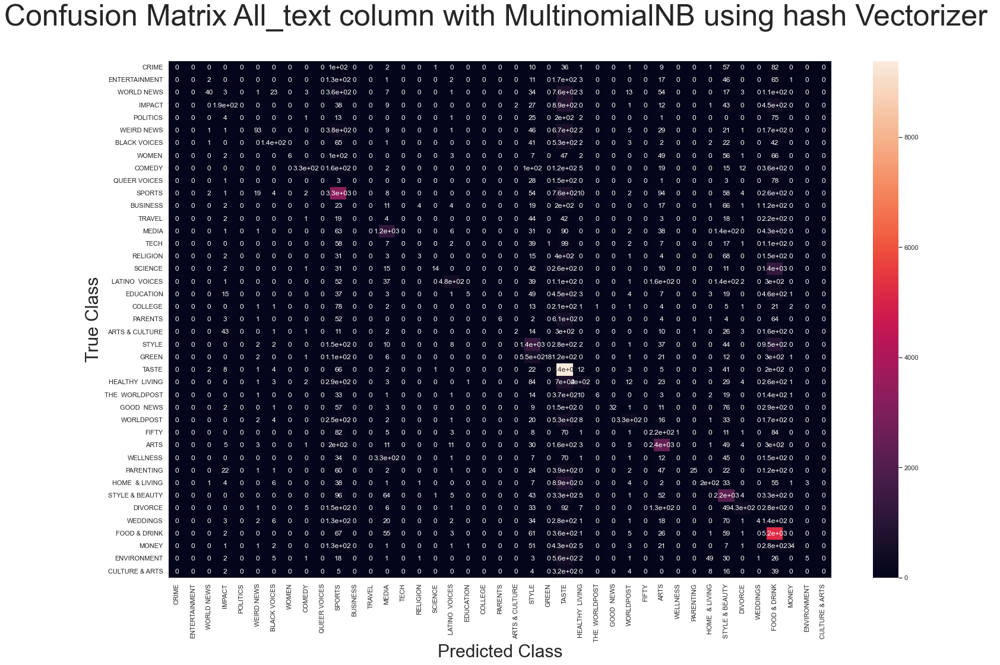

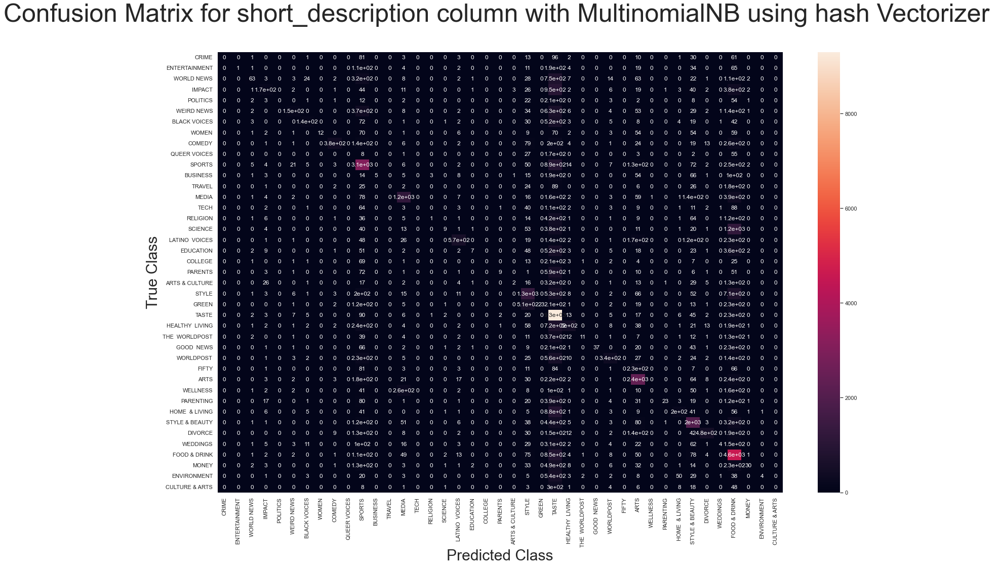

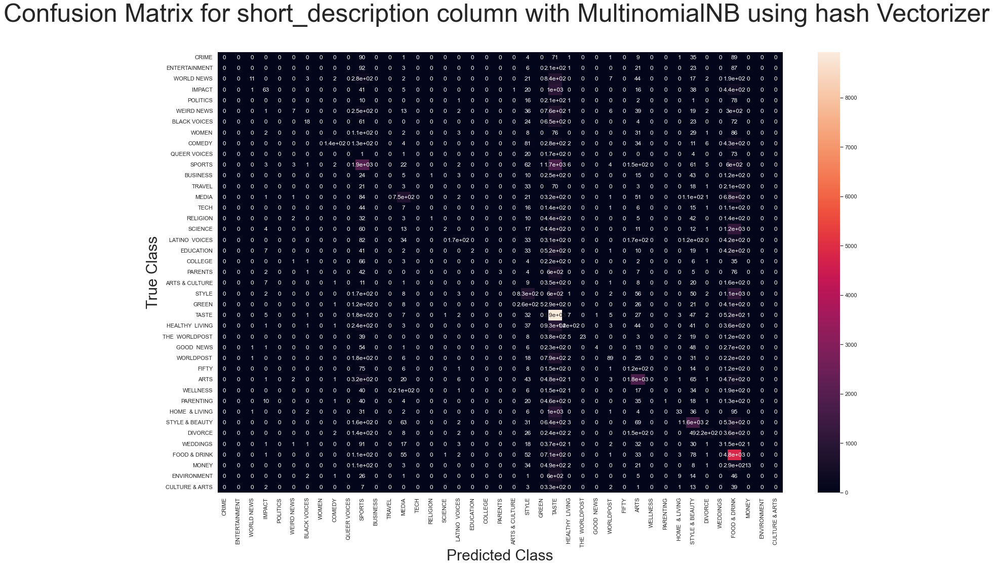

In [643]:
#                             Plotting the classification reports.

# For All_text column
cf_matrix_alltext_hash_mb = confusion_matrix(y_test, y_predict_alltext_hash_mb)
heatmap40 = sns.heatmap(cf_matrix_alltext_hash_mb, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix All_text column with MultinomialNB using hash Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')

cf_matrix_headline_hash_mb = confusion_matrix(y_test, y_predict_headline_hash_mb)
heatmap41 = sns.heatmap(cf_matrix_headline_hash_mb, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with MultinomialNB using hash Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')

cf_matrix_short_hash_mb = confusion_matrix(y_test, y_predict_short_hash_mb)
heatmap42 = sns.heatmap(cf_matrix_short_hash_mb, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with MultinomialNB using hash Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())





# 8)b)

In [532]:
#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The second model that we are going to use is the Logistic Regression.



# svc_alltext_hash = Logistic Regression applied for the All_Text Column with hash Vectorizer.
# svc_headline_hash = Logistic Regression applied for the headlines Column with hash Vectorizer.
# svc_short_hash = Logistic Regression applied for the short_description column with hash Vectorizer.


lr_alltext_hash = LogisticRegression()
lr_alltext_hash.fit(x_train_alltext_hash, y_train)


lr_headline_hash = LogisticRegression()
lr_headline_hash.fit(x_train_headline_hash, y_train)


lr_short_hash = LogisticRegression()
lr_short_hash.fit(x_train_short_hash, y_train)




LogisticRegression()

In [644]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_hash_lr = prediction of the All_Text column (hash) with Logistic Regression.
#y_predict_headline_hash_lr = prediction of the headline column (hash) with Logistic Regression.
#y_predict_short_hash_lr = prediction of the short_description column (hash) with Logistic Regression.


y_predict_alltext_hash_lr = lr_alltext_hash.predict(x_test_alltext_hash)
y_predict_headline_hash_lr = lr_headline_hash.predict(x_test_headline_hash)
y_predict_short_hash_lr = lr_short_hash.predict(x_test_short_hash)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_hash_lr = accuracy of the All_Text column (hash) with Logistic Regression.
# accuracy_headline_hash_lr = accuracy of the headline column (hash) with Logistic Regression.
# accuracy_short_hash_lr = accuracy of the short_description column (hash) with Logistic Regression.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (hash) with Logistic Regression is :\n', accuracy_score(y_predict_alltext_hash_lr, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_hash_lr, y_test)*100, '%')
print('\n\n')
print('the accuracy of headline column (hash) with Logistic Regression is :\n', accuracy_score(y_predict_headline_hash_lr, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_hash_lr, y_test)*100, '%')
print('\n\n')
print('the accuracy of the short_description column (hash) with Logistic Regression is : \n', accuracy_score(y_predict_alltext_hash_lr, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_hash_lr, y_test)*100, '%')
print('\n\n')




the accuracy of the All_Text column (hash) with Logistic Regression is :
 0.5813786180358039
the percentage of accuracy is : 58.13786180358039 %



the accuracy of headline column (hash) with Logistic Regression is :
 0.5446043165467626
the percentage of accuracy is : 54.460431654676256 %



the accuracy of the short_description column (hash) with Logistic Regression is : 
 0.5813786180358039
the percentage of accuracy is : 43.976911494060566 %





In [656]:
#                         Printing the classification reports


# For All_text column
print('\n')
print('      Classification Report for All_Text (hash) using Logistic Regression    \n ')
print(classification_report(y_predict_alltext_hash_lr, y_test))


print('\n\n\n')


# For headline column
print('      Classification Report for headline (hash) using Logistic Regression   \n  ')
print(classification_report(y_predict_headline_hash_lr, y_test))


print('\n\n\n')


# For short_description column
print('      Classification Report for short_description (hash) using Logistic Regression     \n ')
print(classification_report(y_predict_short_hash_lr, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (hash) using Logistic Regression    
 
                precision    recall  f1-score   support

          ARTS       0.08      0.42      0.14        60
ARTS & CULTURE       0.14      0.44      0.21       137
  BLACK VOICES       0.32      0.54      0.40       848
      BUSINESS       0.42      0.46      0.44      1525
       COLLEGE       0.18      0.45      0.26       126
        COMEDY       0.39      0.57      0.46       975
         CRIME       0.47      0.53      0.50       748
CULTURE & ARTS       0.22      0.63      0.33       123
       DIVORCE       0.67      0.82      0.74       918
     EDUCATION       0.19      0.43      0.26       118
 ENTERTAINMENT       0.71      0.53      0.61      6107
   ENVIRONMENT       0.16      0.63      0.26       122
         FIFTY       0.09      0.46      0.15        67
  FOOD & DRINK       0.72      0.62      0.67      2354
     GOOD NEWS       0.09      0.48      0.16        67
         GREEN       

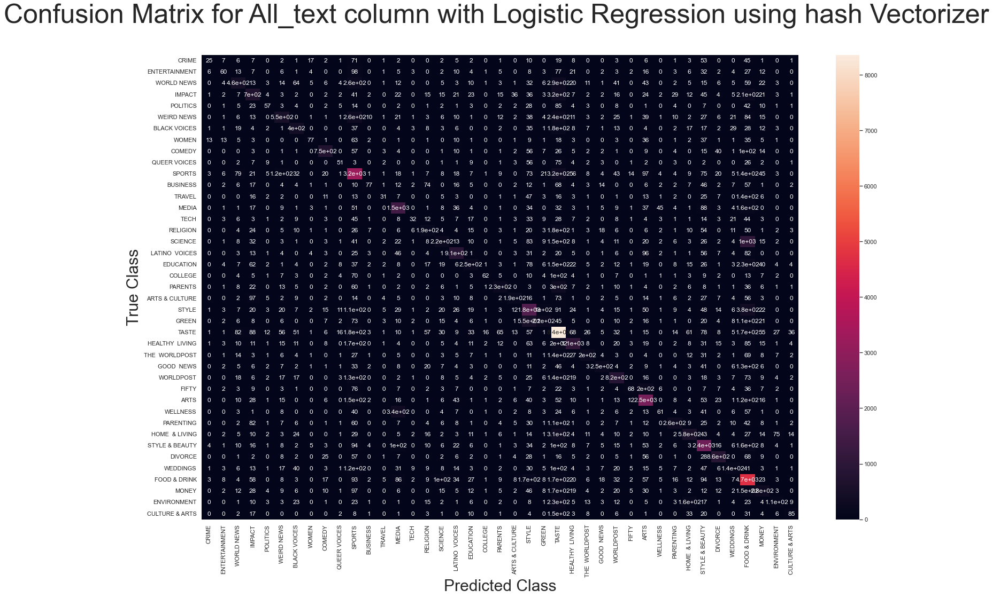

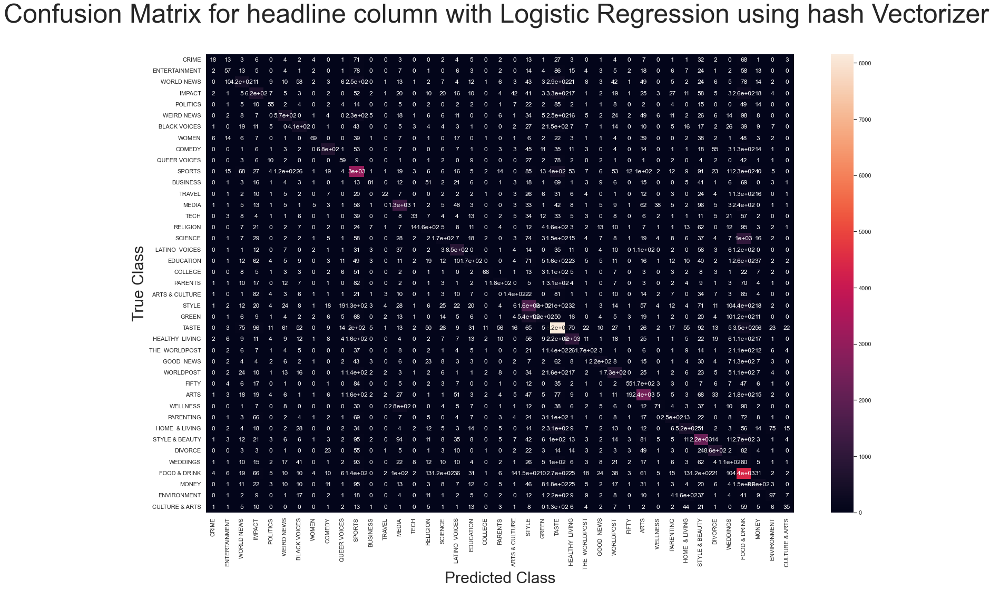

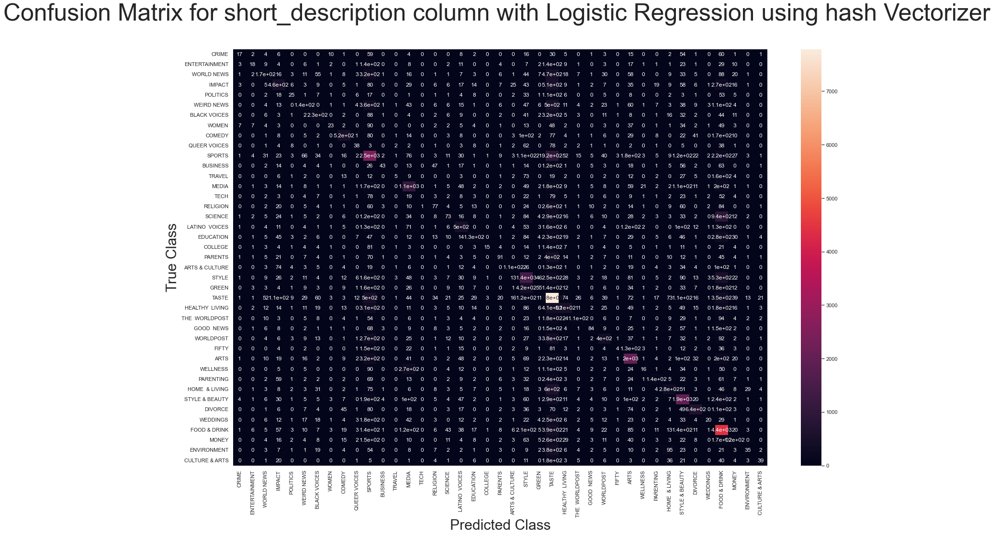

In [657]:
#                               Plotting the confusion matrices


# For All_text column
cf_matrix_alltext_hash_lr = confusion_matrix(y_test, y_predict_alltext_hash_lr)
heatmap51 = sns.heatmap(cf_matrix_alltext_hash_lr, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text column with Logistic Regression using hash Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')

# For headline column
cf_matrix_headline_hash_lr = confusion_matrix(y_test, y_predict_headline_hash_lr)
heatmap52 = sns.heatmap(cf_matrix_headline_hash_lr, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headline column with Logistic Regression using hash Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())

print('\n\n')


# For short_description model
cf_matrix_short_hash_lr = confusion_matrix(y_test, y_predict_short_hash_lr)
heatmap55 = sns.heatmap(cf_matrix_short_hash_lr, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with Logistic Regression using hash Vectorizer \n', fontdict={'fontsize': 50, 'fontweight': 'medium'})
(plt.show())




## 8)c)

In [536]:
#We can now apply our Machine Learning Algorithm to the processed data that we have.
#The last model that we are going to use is the LinearSVC model.



# svc_alltext_hash = LinearSVC applied for the All_Text Column with hash Vectorizer.
# svc_headline_hash =LinearSVC applied for the headlines Column with hash Vectorizer.
# svc_short_hash = LinearSVC applied for the short_description column with hash Vectorizer.


svc_alltext_hash = LinearSVC()
svc_alltext_hash.fit(x_train_alltext_hash, y_train)


svc_headline_hash = LinearSVC()
svc_headline_hash.fit(x_train_headline_hash, y_train)


svc_short_hash = LinearSVC()
svc_short_hash.fit(x_train_short_hash, y_train)




LinearSVC()

In [658]:
#we can now test our model and check the accuracy of the model.

#y_predict_alltext_hash_svc = prediction of the All_Text column (hash) with LinearSVC.
#y_predict_headline_hash_svc = prediction of the headline column (hash) with LinearSVC.
#y_predict_short_hash_svc = prediction of the short_description column (hash) with LinearSVC.


y_predict_alltext_hash_svc = svc_alltext_hash.predict(x_test_alltext_hash)
y_predict_headline_hash_svc = svc_headline_hash.predict(x_test_headline_hash)
y_predict_short_hash_svc = svc_short_hash.predict(x_test_short_hash)

# To predict accuracy_score, we can import it from sklearn.metrics
# And then we print the accuracies of all the models.


# accuracy_alltext_hash_svc = accuracy of the All_Text column (hash) with LinearSVC.
# accuracy_headline_hash_svc = accuracy of the headline column (hash) with LinearSVC.
# accuracy_short_hash_svc = accuracy of the short_description column (hash) with LinearSVC.


from sklearn.metrics import accuracy_score



#now we print the accuracies using our predictions.


print('the accuracy of the All_Text column (hash) with LinearSVC is :\n', accuracy_score(y_predict_alltext_hash_svc, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_alltext_hash_svc, y_test)*100, '%')
print('\n\n')
print('the accuracy of headline column (hash) with LinearSVC is :\n', accuracy_score(y_predict_headline_hash_svc, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_headline_hash_svc, y_test)*100, '%')
print('\n\n')
print('the accuracy of the short_description column (hash) with LinearSVC is : \n', accuracy_score(y_predict_alltext_hash_svc, y_test))
print('the percentage of accuracy is :', accuracy_score(y_predict_short_hash_svc, y_test)*100, '%')
print('\n\n')





the accuracy of the All_Text column (hash) with LinearSVC is :
 0.589894595951146
the percentage of accuracy is : 58.9894595951146 %



the accuracy of headline column (hash) with LinearSVC is :
 0.5588756901455579
the percentage of accuracy is : 55.887569014555794 %



the accuracy of the short_description column (hash) with LinearSVC is : 
 0.589894595951146
the percentage of accuracy is : 44.82683620545424 %





In [659]:
#                        Printing the classification report


# For All_text Column
print('\n')
print('      Classification Report for All_Text (hash) using LineasSVC      \n ')
print(classification_report(y_predict_alltext_hash_svc, y_test))


# For headline column
print('\n\n\n')
print('      Classification Report for headline (hash) using LineasSVC    \n  ')
print(classification_report(y_predict_headline_hash_svc, y_test))


print('\n\n\n')


# For short_description column
print('      Classification Report for short_description (hash) using LineasSVC      \n ')
print(classification_report(y_predict_short_hash_svc, y_test))



#precision - is accuracy of positive predictions. (True positive)/(True positive + False positive )
#recall - fraction of positives that were correctly identified. (True Positive)/(True Positive + False Negative)
#F-1 Score - F-1 score is the weighted harmonic mean of recall and precision. (2*(recall * prescicion))/(recall + precision)
#Support - Support is the number of actual occurences in the dataset.
#macro average - Macro average is the direct average of the values in that column.
#weighted average - weighted average is the average according to the weights of that class. ie weighted average of the values in that class.



      Classification Report for All_Text (hash) using LineasSVC      
 
                precision    recall  f1-score   support

          ARTS       0.16      0.32      0.21       150
ARTS & CULTURE       0.22      0.37      0.28       264
  BLACK VOICES       0.37      0.51      0.43      1044
      BUSINESS       0.42      0.46      0.44      1534
       COLLEGE       0.34      0.45      0.38       241
        COMEDY       0.42      0.52      0.46      1138
         CRIME       0.52      0.49      0.51       899
CULTURE & ARTS       0.25      0.46      0.32       187
       DIVORCE       0.73      0.77      0.75      1052
     EDUCATION       0.27      0.37      0.31       197
 ENTERTAINMENT       0.67      0.60      0.63      5130
   ENVIRONMENT       0.27      0.51      0.35       245
         FIFTY       0.13      0.35      0.19       127
  FOOD & DRINK       0.71      0.61      0.65      2355
     GOOD NEWS       0.17      0.33      0.23       179
         GREEN       0.31    

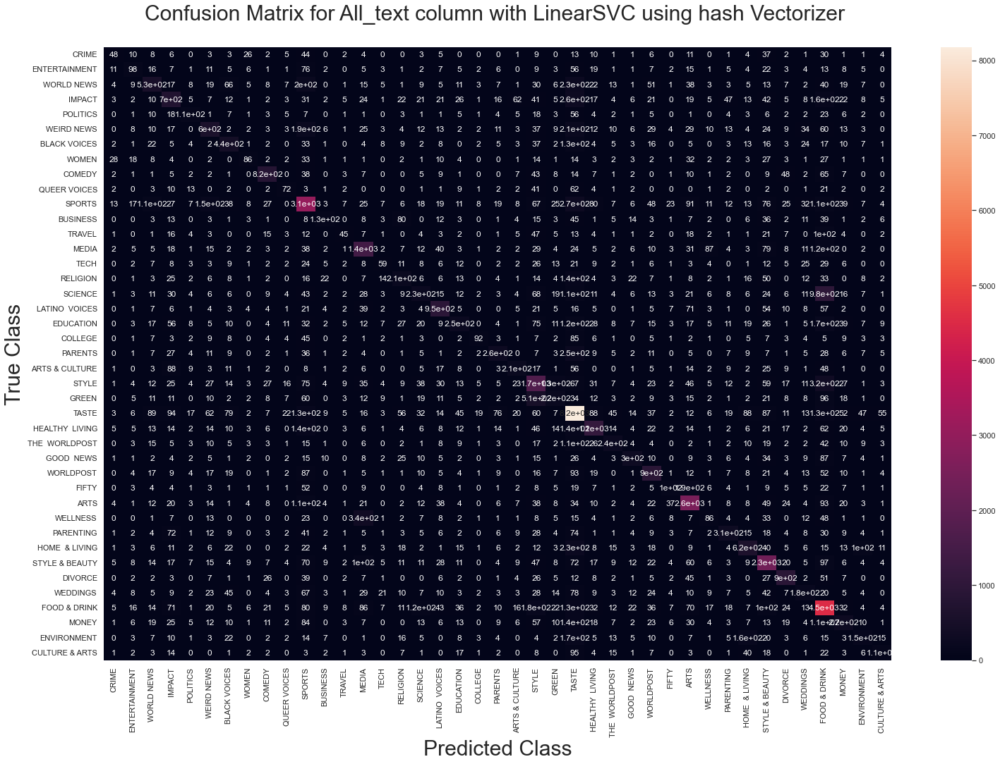

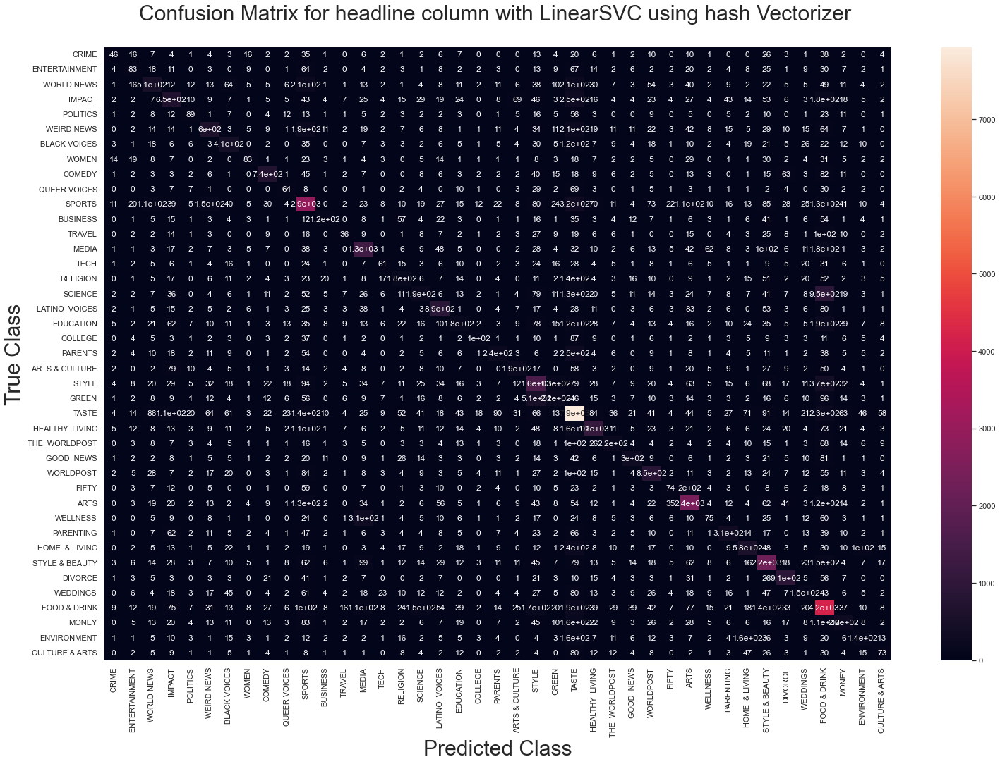

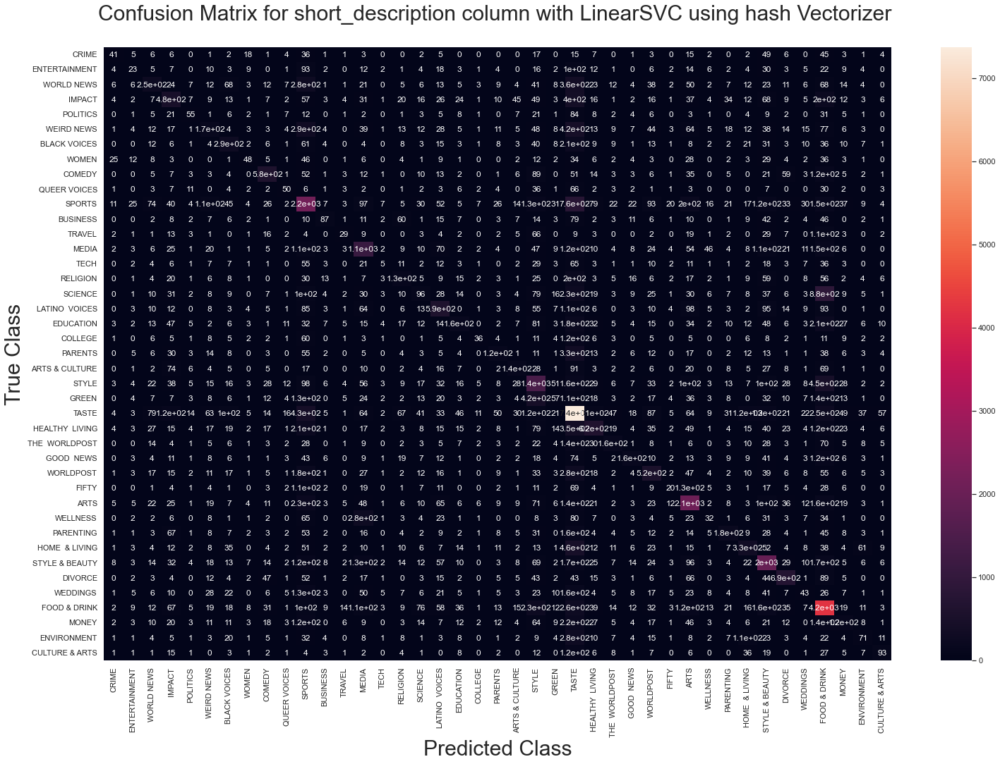

In [662]:
#                    PLotting the Confusion Matrices


# For All_text Column
cf_matrix_alltext_hash_svc = confusion_matrix(y_test, y_predict_alltext_hash_svc)
heatmap51 = sns.heatmap(cf_matrix_alltext_hash_svc, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for All_text column with LinearSVC using hash Vectorizer \n', fontdict={'fontsize': 30, 'fontweight': 'medium'})
(plt.show())

print('\n\n\n')


# For headline column
cf_matrix_headline_hash_svc = confusion_matrix(y_test, y_predict_headline_hash_svc)
heatmap52 = sns.heatmap(cf_matrix_headline_hash_svc, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for headline column with LinearSVC using hash Vectorizer \n', fontdict={'fontsize': 30, 'fontweight': 'medium'})
(plt.show())



print('\n\n\n')



# For short_description column
cf_matrix_short_hash_svc = confusion_matrix(y_test, y_predict_short_hash_svc)
heatmap55 = sns.heatmap(cf_matrix_short_hash_svc, xticklabels=Labels, yticklabels=Labels, annot = True)
plt.xlabel('Predicted Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.ylabel('True Class', fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.title('Confusion Matrix for short_description column with LinearSVC using hash Vectorizer \n', fontdict={'fontsize': 30, 'fontweight': 'medium'})
(plt.show())





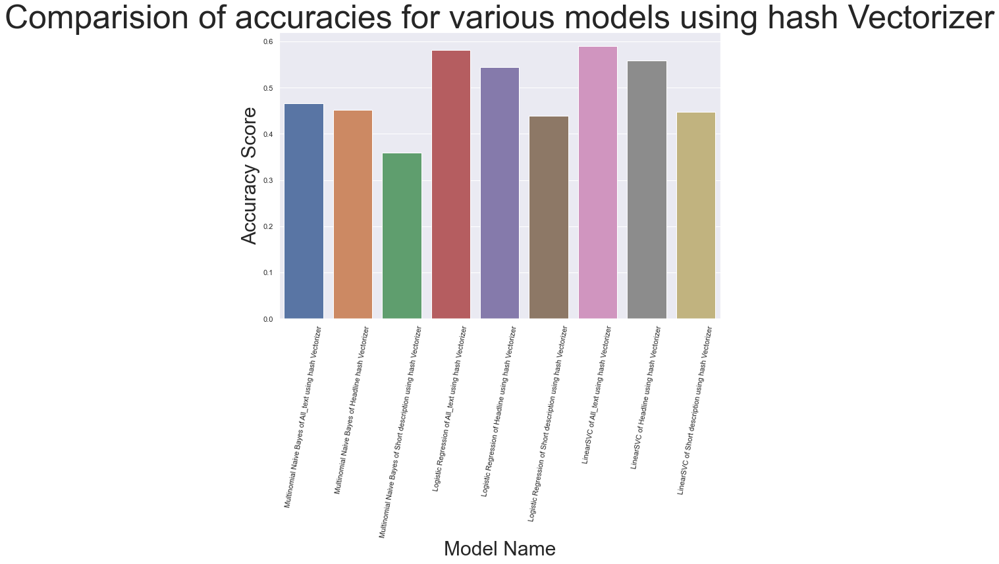

In [683]:
models_hash = ['Multinomial Naive Bayes of All_text using hash Vectorizer',
                             'Multinomial Naive Bayes of Headline hash Vectorizer',
                             'Multinomial Naive Bayes of Short description using hash Vectorizer',
                             'Logistic Regression of All_text using hash Vectorizer',
                             'Logistic Regression of Headline using hash Vectorizer',
                             'Logistic Regression of Short description using hash Vectorizer',
                             'LinearSVC of All_text using hash Vectorizer',
                             'LinearSVC of Headline using hash Vectorizer',
                             'LinearSVC of Short description using hash Vectorizer']


df5 = pd.DataFrame({'model':['Multinomial Naive Bayes of All_text using hash Vectorizer',
                             'Multinomial Naive Bayes of Headline hash Vectorizer',
                             'Multinomial Naive Bayes of Short description using hash Vectorizer',
                             'Logistic Regression of All_text using hash Vectorizer',
                             'Logistic Regression of Headline using hash Vectorizer',
                             'Logistic Regression of Short description using hash Vectorizer',
                             'LinearSVC of All_text using hash Vectorizer',
                             'LinearSVC of Headline using hash Vectorizer',
                             'LinearSVC of Short description using hash Vectorizer'], 
                    'val':  [accuracy_score(y_predict_alltext_hash_mb, y_test),
                            accuracy_score(y_predict_headline_hash_mb, y_test),
                            accuracy_score(y_predict_short_hash_mb, y_test),
                            accuracy_score(y_predict_alltext_hash_lr, y_test),
                            accuracy_score(y_predict_headline_hash_lr, y_test),
                            accuracy_score(y_predict_short_hash_lr, y_test),
                            accuracy_score(y_predict_alltext_hash_svc, y_test),
                            accuracy_score(y_predict_headline_hash_svc, y_test),
                            accuracy_score(y_predict_short_hash_svc, y_test)]} , index= models_hash)


plotdata = df5
plt.figure(figsize=(12, 8))
sns.barplot(df5['model'], df5['val'])
plt.title("Comparision of accuracies for various models using hash Vectorizer", fontdict={'fontsize': 50, 'fontweight': 'medium'})
plt.xlabel("Model Name",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.ylabel("Accuracy Score",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.xticks(rotation = 80)
plt.show()

# 9) Comparing the accuracies by different Models.

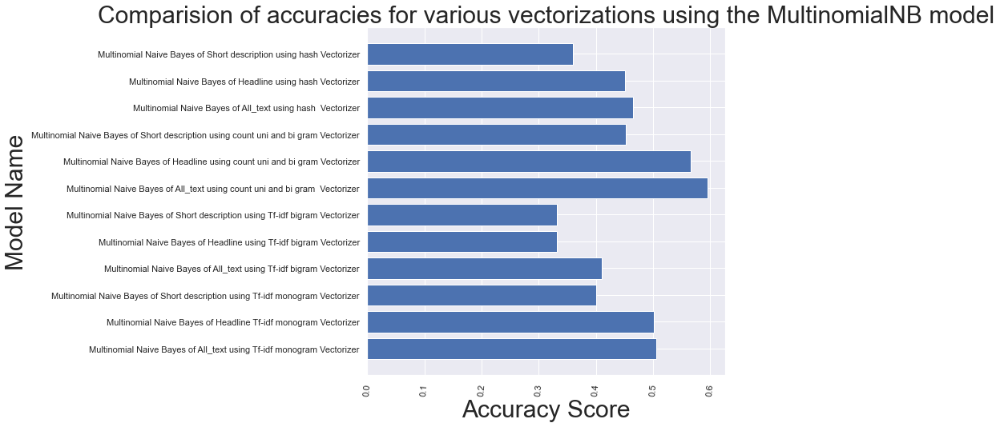

In [825]:
# Comparing accuracies of Multinomial Naive Bayes models.


models_Multi = ['Multinomial Naive Bayes of All_text using Tf-idf monogram Vectorizer',
                             'Multinomial Naive Bayes of Headline Tf-idf monogram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Tf-idf monogram Vectorizer',
                             'Multinomial Naive Bayes of All_text using Tf-idf bigram Vectorizer',
                             'Multinomial Naive Bayes of Headline using Tf-idf bigram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Tf-idf bigram Vectorizer',
                             'Multinomial Naive Bayes of All_text using count uni and bi gram  Vectorizer',
                             'Multinomial Naive Bayes of Headline using count uni and bi gram Vectorizer',
                             'Multinomial Naive Bayes of Short description using count uni and bi gram Vectorizer',
                             'Multinomial Naive Bayes of All_text using hash  Vectorizer',
                             'Multinomial Naive Bayes of Headline using hash Vectorizer',
                             'Multinomial Naive Bayes of Short description using hash Vectorizer']


df22 = pd.DataFrame({'model':['Multinomial Naive Bayes of All_text using Tf-idf monogram Vectorizer',
                             'Multinomial Naive Bayes of Headline Tf-idf monogram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Tf-idf monogram Vectorizer',
                             'Multinomial Naive Bayes of All_text using Tf-idf bigram Vectorizer',
                             'Multinomial Naive Bayes of Headline using Tf-idf bigram Vectorizer',
                             'Multinomial Naive Bayes of Short description using Tf-idf bigram Vectorizer',
                             'Multinomial Naive Bayes of All_text using count uni and bi gram  Vectorizer',
                             'Multinomial Naive Bayes of Headline using count uni and bi gram Vectorizer',
                             'Multinomial Naive Bayes of Short description using count uni and bi gram Vectorizer',
                             'Multinomial Naive Bayes of All_text using hash  Vectorizer',
                             'Multinomial Naive Bayes of Headline using hash Vectorizer',
                             'Multinomial Naive Bayes of Short description using hash Vectorizer'], 
                    'val':  [accuracy_score(y_predict_alltext_tfidf_mb, y_test),
                            accuracy_score(y_predict_headline_tfidf_mb, y_test),
                            accuracy_score(y_predict_short_tfidf_mb, y_test),
                            accuracy_score(y_predict_alltext_tfidf_mb2, y_test),
                            accuracy_score(y_predict_headline_tfidf_mb2, y_test),
                            accuracy_score(y_predict_short_tfidf_mb2, y_test),
                            accuracy_score(y_predict_alltext_count_mb12, y_test),
                            accuracy_score(y_predict_headline_count_mb12, y_test),
                            accuracy_score(y_predict_short_count_mb12, y_test),
                            accuracy_score(y_predict_alltext_hash_mb, y_test),
                            accuracy_score(y_predict_headline_hash_mb, y_test),
                            accuracy_score(y_predict_short_hash_mb, y_test)]} , index= models_Multi)


plotdata = df22
plt.figure(figsize=(8, 8))
plt.barh(df22['model'], df22['val'])
plt.title("Comparision of accuracies for various vectorizations using the MultinomialNB model", fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.xlabel("Accuracy Score",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.ylabel("Model Name",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.xticks(rotation = 85)
plt.show()

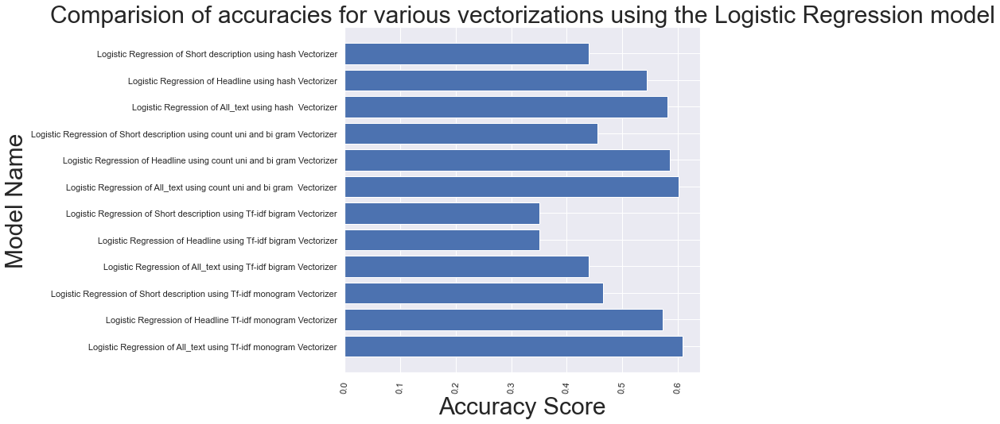

In [756]:
# Comparing accuracies of Logistic Regression models.


models_LogisticRegression = ['Logistic Regression of All_text using Tf-idf monogram Vectorizer',
                             'Logistic Regression of Headline Tf-idf monogram Vectorizer',
                             'Logistic Regression of Short description using Tf-idf monogram Vectorizer',
                             'Logistic Regression of All_text using Tf-idf bigram Vectorizer',
                             'Logistic Regression of Headline using Tf-idf bigram Vectorizer',
                             'Logistic Regression of Short description using Tf-idf bigram Vectorizer',
                             'Logistic Regression of All_text using count uni and bi gram  Vectorizer',
                             'Logistic Regression of Headline using count uni and bi gram Vectorizer',
                             'Logistic Regression of Short description using count uni and bi gram Vectorizer',
                             'Logistic Regression of All_text using hash  Vectorizer',
                             'Logistic Regression of Headline using hash Vectorizer',
                             'Logistic Regression of Short description using hash Vectorizer']


df24 = pd.DataFrame({'model':['Logistic Regression of All_text using Tf-idf monogram Vectorizer',
                             'Logistic Regression of Headline Tf-idf monogram Vectorizer',
                             'Logistic Regression of Short description using Tf-idf monogram Vectorizer',
                             'Logistic Regression of All_text using Tf-idf bigram Vectorizer',
                             'Logistic Regression of Headline using Tf-idf bigram Vectorizer',
                             'Logistic Regression of Short description using Tf-idf bigram Vectorizer',
                             'Logistic Regression of All_text using count uni and bi gram  Vectorizer',
                             'Logistic Regression of Headline using count uni and bi gram Vectorizer',
                             'Logistic Regression of Short description using count uni and bi gram Vectorizer',
                             'Logistic Regression of All_text using hash  Vectorizer',
                             'Logistic Regression of Headline using hash Vectorizer',
                             'Logistic Regression of Short description using hash Vectorizer'], 
                    'val':  [accuracy_score(y_predict_alltext_tfidf_lr, y_test),
                            accuracy_score(y_predict_headline_tfidf_lr, y_test),
                            accuracy_score(y_predict_short_tfidf_lr, y_test),
                            accuracy_score(y_predict_alltext_tfidf_lr2, y_test),
                            accuracy_score(y_predict_headline_tfidf_lr2, y_test),
                            accuracy_score(y_predict_short_tfidf_lr2, y_test),
                            accuracy_score(y_predict_alltext_count_lr12, y_test),
                            accuracy_score(y_predict_headline_count_lr12, y_test),
                            accuracy_score(y_predict_short_count_lr12, y_test),
                            accuracy_score(y_predict_alltext_hash_lr, y_test),
                            accuracy_score(y_predict_headline_hash_lr, y_test),
                            accuracy_score(y_predict_short_hash_lr, y_test)]} , index= models_LogisticRegression)


plotdata = df24
plt.figure(figsize=(8, 8))
plt.barh(df24['model'], df24['val'])
plt.title("Comparision of accuracies for various vectorizations using the Logistic Regression model", fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.xlabel("Accuracy Score",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.ylabel("Model Name",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.xticks(rotation = 85)
plt.show()

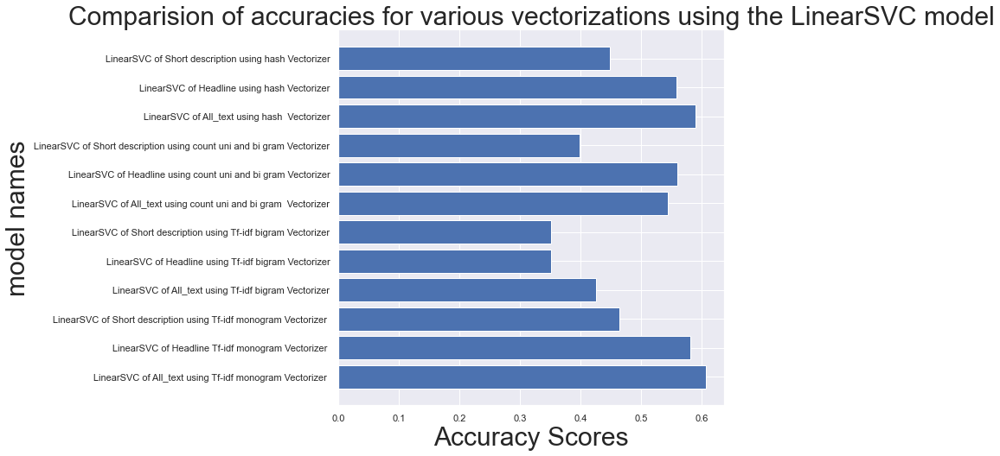

In [755]:
# Comparing accuracies of all LinearSVC models.

models_LinearSVC = ['LinearSVC of All_text using Tf-idf monogram Vectorizer',
                             'LinearSVC of Headline Tf-idf monogram Vectorizer',
                             'LinearSVC of  Short description using Tf-idf monogram Vectorizer',
                             'LinearSVC of All_text using Tf-idf bigram Vectorizer',
                             'LinearSVC of Headline using Tf-idf bigram Vectorizer',
                            'LinearSVC of Short description using Tf-idf bigram Vectorizer',
                             'LinearSVC of  All_text using count uni and bi gram  Vectorizer',
                             'LinearSVC of Headline using count uni and bi gram Vectorizer',
                             'LinearSVC of Short description using count uni and bi gram Vectorizer',
                             'LinearSVC of  All_text using hash  Vectorizer',
                             'LinearSVC of Headline using hash Vectorizer',
                             'LinearSVC of Short description using hash Vectorizer']


df28 = pd.DataFrame({'model':['LinearSVC of All_text using Tf-idf monogram Vectorizer ',
                             'LinearSVC of Headline Tf-idf monogram Vectorizer ',
                             'LinearSVC of Short description using Tf-idf monogram Vectorizer ',
                             'LinearSVC of All_text using Tf-idf bigram Vectorizer',
                             'LinearSVC of Headline using Tf-idf bigram Vectorizer',
                             'LinearSVC of Short description using Tf-idf bigram Vectorizer',
                             'LinearSVC of All_text using count uni and bi gram  Vectorizer',
                             'LinearSVC of Headline using count uni and bi gram Vectorizer',
                             'LinearSVC of Short description using count uni and bi gram Vectorizer',
                             'LinearSVC of All_text using hash  Vectorizer',
                             'LinearSVC of Headline using hash Vectorizer',
                             'LinearSVC of Short description using hash Vectorizer'], 
                    'val':  [accuracy_score(y_predict_alltext_tfidf_svc, y_test),
                            accuracy_score(y_predict_headline_tfidf_svc, y_test),
                            accuracy_score(y_predict_short_tfidf_svc, y_test),
                            accuracy_score(y_predict_alltext_tfidf_svc2, y_test),
                            accuracy_score(y_predict_headline_tfidf_svc2, y_test),
                            accuracy_score(y_predict_short_tfidf_svc2, y_test),
                            accuracy_score(y_predict_alltext_count_svc12, y_test),
                            accuracy_score(y_predict_headline_count_svc12, y_test),
                            accuracy_score(y_predict_short_count_svc12, y_test),
                            accuracy_score(y_predict_alltext_hash_svc, y_test),
                            accuracy_score(y_predict_headline_hash_svc, y_test),
                            accuracy_score(y_predict_short_hash_svc, y_test)]} , index= models_LinearSVC)


plotdata = df28
plt.figure(figsize=(8, 8))
plt.barh(df28['model'], df28['val'])
a.set_xticklabels(a.get_xticks(), size=8)
plt.title("Comparision of accuracies for various vectorizations using the LinearSVC model", fontdict={'fontsize': 30, 'fontweight': 'medium'})
plt.xlabel("Accuracy Scores",fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.ylabel('model names',fontdict={'fontsize': 30, 'fontweight': 'medium'} )
plt.show()

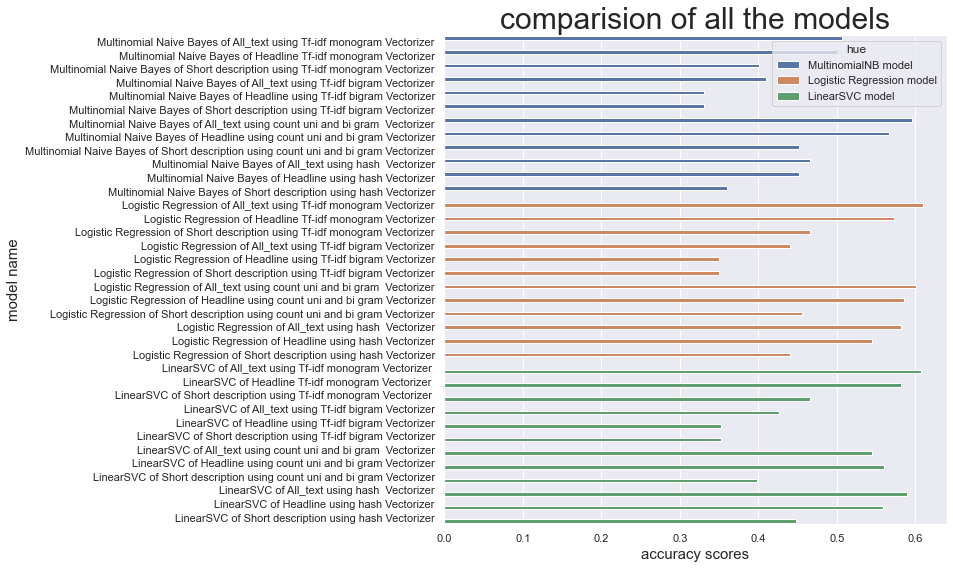

In [769]:
# Comparing all the accuracies.

df22['hue'] = 'MultinomialNB model'
df24['hue'] = 'Logistic Regression model'
df28['hue'] = 'LinearSVC model'

r3 = pd.concat([df22, df24, df28])
plt.figure(figsize=(9,9))
sns.barplot(x = 'val', y= 'model', data = r3, hue = 'hue')
plt.title('comparision of all the models', fontdict={'fontsize':30, 'fontweight':'medium'})
plt.xlabel('accuracy scores', fontdict={'fontsize':15, 'fontweight':'medium'})
plt.ylabel('model name', fontdict={'fontsize':15, 'fontweight':'medium'})
plt.show()

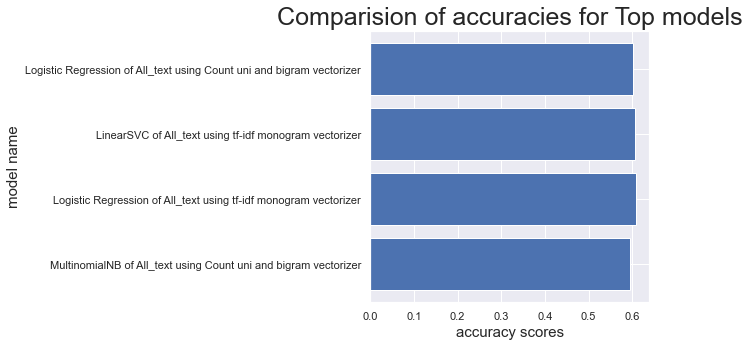

In [792]:
# Comparing accuracies of all top models.


top_models = ['MultinomialNB of All_text using Count uni and bigram vectorizer', 
             ' Logistic Regression of All_text using tf-idf monogram vectorizer',
             'LinearSVC of All_text using tf-idf monogram vectorizer',
             'Logistic Regression of All_text using Count uni and bigram vectorizer']

acc2 = pd.DataFrame({'model': ['MultinomialNB of All_text using Count uni and bigram vectorizer', 
             ' Logistic Regression of All_text using tf-idf monogram vectorizer',
             'LinearSVC of All_text using tf-idf monogram vectorizer',
             'Logistic Regression of All_text using Count uni and bigram vectorizer'], 'val' : [accuracy_score(y_predict_alltext_count_mb12, y_test),
                                                    accuracy_score(y_predict_alltext_tfidf_lr, y_test),
                                                    accuracy_score(y_predict_alltext_tfidf_svc, y_test),
                                                    accuracy_score(y_predict_alltext_count_lr12, y_test)]}, index=top_models)
plotdata = acc2
plt.figure(figsize=(5,5))
plt.barh(acc2['model'], acc2['val'])
plt.xlabel('accuracy scores', fontdict={'fontsize':15, 'fontweight':'medium'})
plt.ylabel('model name', fontdict={'fontsize':15, 'fontweight':'medium'})
plt.title('Comparision of accuracies for Top models',fontdict={'fontsize':25, 'fontweight':'medium'})
plt.show()

## 10) Testing the model using sklearn Pipeline

In [824]:
import pickle

In [808]:
# creating a pipeline to store the model.

models = [('Logistic Regression', LogisticRegression())]
model5 = []
for name, clf in models:
    pipe = Pipeline([('vect', CountVectorizer(max_df=0.8, min_df=10, ngram_range=(1, 2))),
                    (name, clf),
                    ])
    pipe.fit(x_train, y_train)
    y_pred = pipe.predict(x_test)
    
    model5.append(pipe)
    
# model being saved using pickle.

filename = 'lr1.sav'    
pickle.dump(model5[0], open(filename, 'wb'))

In [812]:
models = [('Logistic Regression2', LogisticRegression())]
model6 = []
for name, clf in models:
    pipe = Pipeline([('vect', TfidfVectorizer(max_df=0.8, min_df=10, ngram_range=(1, 1))),
                    (name, clf),
                    ])
    pipe.fit(x_train, y_train)
    y_pred = pipe.predict(x_test)
    
    model6.append(pipe)
    

filename = 'lr2.sav'    
pickle.dump(model6[0], open(filename, 'wb'))

In [811]:
models = [('Multinomia Naive Bayes', MultinomialNB())]
model7 = []
for name, clf in models:
    pipe = Pipeline([('vect', CountVectorizer(max_df=0.8, min_df=10, ngram_range=(1, 2))),
                    (name, clf),
                    ])
    pipe.fit(x_train, y_train)
    y_pred = pipe.predict(x_test)
    
    model7.append(pipe)
    
    
filename = 'mb1.sav'    
pickle.dump(model7[0], open(filename, 'wb'))

In [813]:
models = [('LinearSVC', LinearSVC())]
model8 = []
for name, clf in models:
    pipe = Pipeline([('vect', TfidfVectorizer(max_df=0.8, min_df=10, ngram_range=(1, 1))),
                    (name, clf),
                    ])
    pipe.fit(x_train, y_train)
    y_pred = pipe.predict(x_test)
    
    model8.append(pipe)
    
    
filename = 'svc1.sav'    
pickle.dump(model8[0], open(filename, 'wb'))

In [816]:
model_1  = pickle.load(open('lr1.sav', 'rb'))
model_2  = pickle.load(open('lr2.sav', 'rb'))
model_3  = pickle.load(open('mb1.sav', 'rb'))
model_4  = pickle.load(open('svc1.sav', 'rb'))

In [835]:
print('a: Multinomial Naive Bayes Model\n\n b: Logistic Regression Model 1\n\n c: Logistic Regression Model 2\n\n d: Linear SVC Model')
model_select = input(str('please enter the model you want to select: '))
if model_select == 'a':
    x = input(str('please enter your text\n'))
    preprocess_text(x)
    stemming(x)
    lemmatization(x)
    remove_punctuation(x)
    remove_stopwords(x)
    l = ((model_1.predict([x])))
    print(l)
elif model_select == 'b':
    x = input(str('please enter your text\n'))
    preprocess_text(x)
    stemming(x)
    lemmatization(x)
    remove_punctuation(x)
    remove_stopwords(x)
    m = ((model_2.predict([x])))
    print(m)
elif model_select == 'c':
    x = input(str('please enter your text\n'))
    preprocess_text(x)
    stemming(x)
    lemmatization(x)
    remove_punctuation(x)
    remove_stopwords(x)
    n = ((model_3.predict([x])))
    print(n)
elif model_select == 'd':
    x = input(str('please enter your text\n'))
    preprocess_text(x)
    stemming(x)
    lemmatization(x)
    remove_punctuation(x)
    remove_stopwords(x)
    r = ((model_4.predict([x])))
    print(r)
else: 
    print('please enter correct model\n')

a: Multinomial Naive Bayes Model

 b: Logistic Regression Model 1

 c: Logistic Regression Model 2

 d: Linear SVC Model
please enter the model you want to select: b
please enter your text
kill a man
['CRIME']
